import yfinance as yf
import pandas as pd

IBM = yf.Ticker("IBM")

data = IBM.history(period="60y")

data.to_csv("IBM_data_for_60_years.csv")

print(data.head())


In [1]:
import pandas as pd
df = pd.read_csv('IBM_data_60_years.csv')
df.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1964-09-14 00:00:00-04:00,1.409715,1.414687,1.365791,1.365791,1079472,0.0,0.0
1,1964-09-15 00:00:00-04:00,1.369935,1.389825,1.369935,1.380709,1004160,0.0,0.0
2,1964-09-16 00:00:00-04:00,1.384025,1.414274,1.384025,1.414274,728016,0.0,0.0
3,1964-09-17 00:00:00-04:00,1.422147,1.443695,1.422147,1.438722,771948,0.0,0.0
4,1964-09-18 00:00:00-04:00,1.438721,1.444523,1.402256,1.410544,809604,0.0,0.0


In [2]:
df = df.drop(columns=['Dividends', 'Stock Splits'])


In [3]:
df['Date'] = pd.to_datetime(df['Date'], errors='coerce', utc=True)

df['Date'] = df['Date'].dt.tz_localize(None)

df['Date'] = df['Date'].dt.normalize()




In [4]:
df.head()

,Date,Open,High,Low,Close,Volume
0,1964-09-14,1.409715,1.414687,1.365791,1.365791,1079472
1,1964-09-15,1.369935,1.389825,1.369935,1.380709,1004160
2,1964-09-16,1.384025,1.414274,1.384025,1.414274,728016
3,1964-09-17,1.422147,1.443695,1.422147,1.438722,771948
4,1964-09-18,1.438721,1.444523,1.402256,1.410544,809604


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15103 entries, 0 to 15102
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    15103 non-null  datetime64[ns]
 1   Open    15103 non-null  float64       
 2   High    15103 non-null  float64       
 3   Low     15103 non-null  float64       
 4   Close   15103 non-null  float64       
 5   Volume  15103 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 708.1 KB


## weekly_sequences

In [6]:
weekly_sequences = df.resample('W', on='Date').mean()


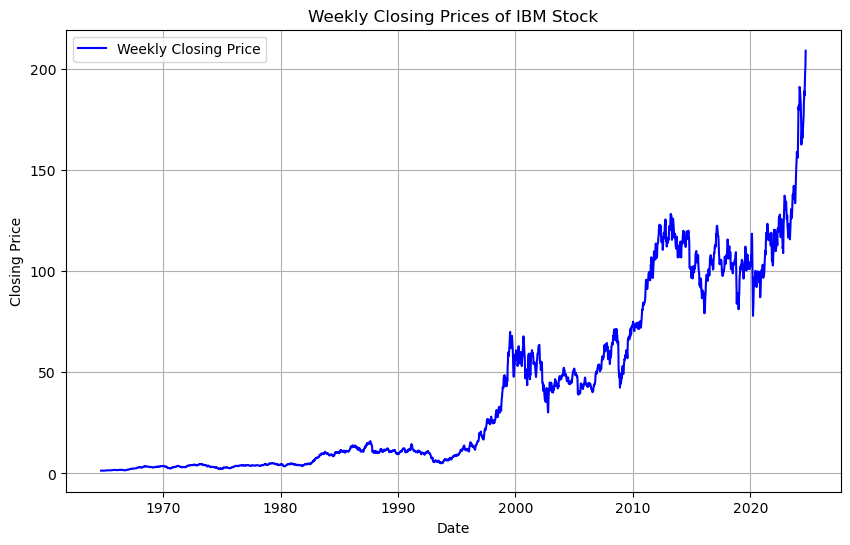

In [7]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(weekly_sequences.index, weekly_sequences['Close'], label='Weekly Closing Price', color='b')
plt.title('Weekly Closing Prices of IBM Stock')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.grid(True)
plt.legend()
plt.show()


In [8]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

normalized_data = scaler.fit_transform(weekly_sequences)

normalized_df = pd.DataFrame(normalized_data, columns=weekly_sequences.columns, index=weekly_sequences.index)
normalized_df.head()


,Open,High,Low,Close,Volume
Date,,,,,
1964-09-20,-0.890397,-0.891307,-0.889510,-0.890407,-1.074335
1964-09-27,-0.890047,-0.890965,-0.888808,-0.889839,-1.175750
1964-10-04,-0.889458,-0.890695,-0.888399,-0.889478,-1.225221
1964-10-11,-0.890088,-0.891257,-0.888951,-0.890025,-1.200794
1964-10-18,-0.890282,-0.891394,-0.889202,-0.890215,-1.190591


In [9]:
normalized_df.sample()

,Open,High,Low,Close,Volume
Date,,,,,
2002-08-25,0.023924,0.029698,0.016363,0.028664,0.646788


#### trying Kmeans only with 2 columns

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


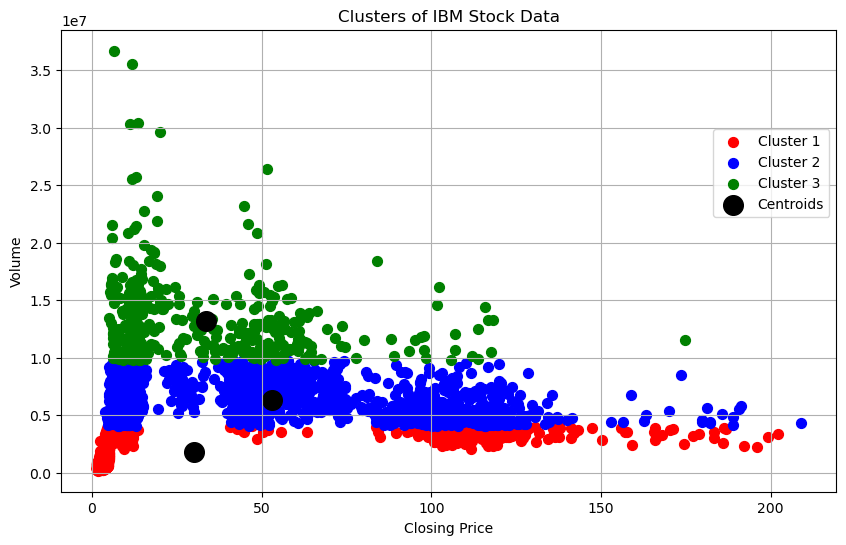

In [10]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

X = weekly_sequences[['Close', 'Volume']].values

kmeans = KMeans(n_clusters=3, random_state=42)
y_kmeans = kmeans.fit_predict(X)

plt.figure(figsize=(10, 6))

plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s=50, c='red', label='Cluster 1')

plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s=50, c='blue', label='Cluster 2')

plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s=50, c='green', label='Cluster 3')

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='black', label='Centroids')

plt.title('Clusters of IBM Stock Data')
plt.xlabel('Closing Price')
plt.ylabel('Volume')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()


#### Now with PCA

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


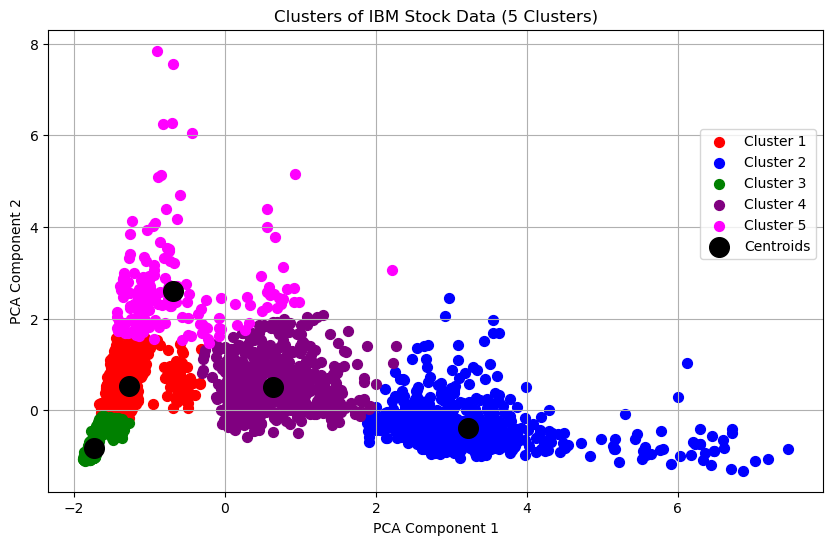

In [11]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score

pca = PCA(n_components=2)
pca_data = pca.fit_transform(normalized_data)

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(pca_data)

plt.figure(figsize=(10, 6))

plt.scatter(pca_data[kmeans.labels_ == 0, 0], pca_data[kmeans.labels_ == 0, 1], s=50, c='red', label='Cluster 1')
plt.scatter(pca_data[kmeans.labels_ == 1, 0], pca_data[kmeans.labels_ == 1, 1], s=50, c='blue', label='Cluster 2')
plt.scatter(pca_data[kmeans.labels_ == 2, 0], pca_data[kmeans.labels_ == 2, 1], s=50, c='green', label='Cluster 3')
plt.scatter(pca_data[kmeans.labels_ == 3, 0], pca_data[kmeans.labels_ == 3, 1], s=50, c='purple', label='Cluster 4')
plt.scatter(pca_data[kmeans.labels_ == 4, 0], pca_data[kmeans.labels_ == 4, 1], s=50, c='magenta', label='Cluster 5')

plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='black', label='Centroids')

plt.title('Clusters of IBM Stock Data (5 Clusters)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()


In [12]:
weekly_sequences['Cluster'] = kmeans.labels_


In [13]:
cluster_summary = weekly_sequences.groupby('Cluster').mean()

cluster_summary


,Open,High,Low,Close,Volume
Cluster,,,,,
0,11.940941,12.051965,11.832682,11.938906,7.010085e+06
1,112.990725,113.853337,112.163331,113.026402,4.753402e+06
2,3.915221,3.945704,3.885247,3.915480,1.314479e+06
3,54.146617,54.781134,53.576016,54.194179,7.548337e+06
4,20.822455,21.184353,20.447175,20.805345,1.560270e+07


In [14]:
silhouette_avg = silhouette_score(pca_data, kmeans.labels_)
silhouette_avg

0.6037866536034875

In [15]:
weeks_in_clusters = weekly_sequences[['Cluster']].reset_index()

weeks_in_clusters.sample(20)


,Date,Cluster
225,1969-01-12,2
501,1974-04-28,2
355,1971-07-11,2
965,1983-03-20,2
2035,2003-09-21,3
1662,1996-07-28,4
2282,2008-06-15,3
338,1971-03-14,2
2357,2009-11-22,3
2936,2020-12-27,1


### 1995 and above

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\אורי בראל\AppData\Local\Temp\ipykernel_6364\354421139.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekly_sequences_filtered['Cluster'] = kmeans_filtered.labels_


Silhouette Score: 0.46586662848878796
               Open        High         Low       Close        Volume
Cluster                                                              
0         41.568716   42.000757   41.196137   41.595643  6.921389e+06
1        109.076306  109.896870  108.283826  109.099741  4.710149e+06
2         24.195841   24.616862   23.773148   24.193081  1.451319e+07
3        171.826880  173.218639  170.544703  172.008136  4.142020e+06
4         64.873997   65.675743   64.138285   64.934712  8.159315e+06


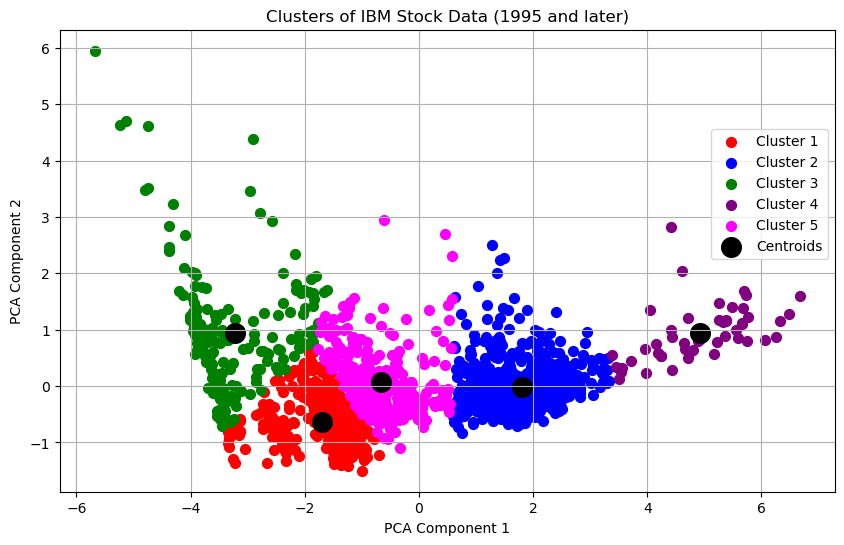

In [16]:

weekly_sequences_filtered = weekly_sequences[weekly_sequences.index >= '1995-01-01']

scaler = StandardScaler()
normalized_data_filtered = scaler.fit_transform(weekly_sequences_filtered.drop(columns=['Cluster']))

pca = PCA(n_components=2)
pca_data_filtered = pca.fit_transform(normalized_data_filtered)

kmeans_filtered = KMeans(n_clusters=5, random_state=42)
kmeans_filtered.fit(pca_data_filtered)

weekly_sequences_filtered['Cluster'] = kmeans_filtered.labels_

silhouette_avg_filtered = silhouette_score(pca_data_filtered, kmeans_filtered.labels_)
print(f'Silhouette Score: {silhouette_avg_filtered}')

weeks_in_clusters_filtered = weekly_sequences_filtered[['Cluster']].reset_index()

cluster_summary_filtered = weekly_sequences_filtered.groupby('Cluster').mean()
print(cluster_summary_filtered)

plt.figure(figsize=(10, 6))

plt.scatter(pca_data_filtered[kmeans_filtered.labels_ == 0, 0], pca_data_filtered[kmeans_filtered.labels_ == 0, 1], s=50, c='red', label='Cluster 1')
plt.scatter(pca_data_filtered[kmeans_filtered.labels_ == 1, 0], pca_data_filtered[kmeans_filtered.labels_ == 1, 1], s=50, c='blue', label='Cluster 2')
plt.scatter(pca_data_filtered[kmeans_filtered.labels_ == 2, 0], pca_data_filtered[kmeans_filtered.labels_ == 2, 1], s=50, c='green', label='Cluster 3')
plt.scatter(pca_data_filtered[kmeans_filtered.labels_ == 3, 0], pca_data_filtered[kmeans_filtered.labels_ == 3, 1], s=50, c='purple', label='Cluster 4')
plt.scatter(pca_data_filtered[kmeans_filtered.labels_ == 4, 0], pca_data_filtered[kmeans_filtered.labels_ == 4, 1], s=50, c='magenta', label='Cluster 5')

plt.scatter(kmeans_filtered.cluster_centers_[:, 0], kmeans_filtered.cluster_centers_[:, 1], s=200, c='black', label='Centroids')

plt.title('Clusters of IBM Stock Data (1995 and later)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()


In [17]:
cluster_summary = weekly_sequences_filtered.groupby('Cluster').mean()

cluster_summary

,Open,High,Low,Close,Volume
Cluster,,,,,
0,41.568716,42.000757,41.196137,41.595643,6.921389e+06
1,109.076306,109.896870,108.283826,109.099741,4.710149e+06
2,24.195841,24.616862,23.773148,24.193081,1.451319e+07
3,171.826880,173.218639,170.544703,172.008136,4.142020e+06
4,64.873997,65.675743,64.138285,64.934712,8.159315e+06


#### Now lets do an elbow test to improve our results

C:\Users\אורי בראל\AppData\Local\Temp\ipykernel_6364\807120680.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekly_sequences_filtered['Volatility (%)'] = ((weekly_sequences_filtered['High'] - weekly_sequences_filtered['Low']) / weekly_sequences_filtered['Low']) * 100
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check

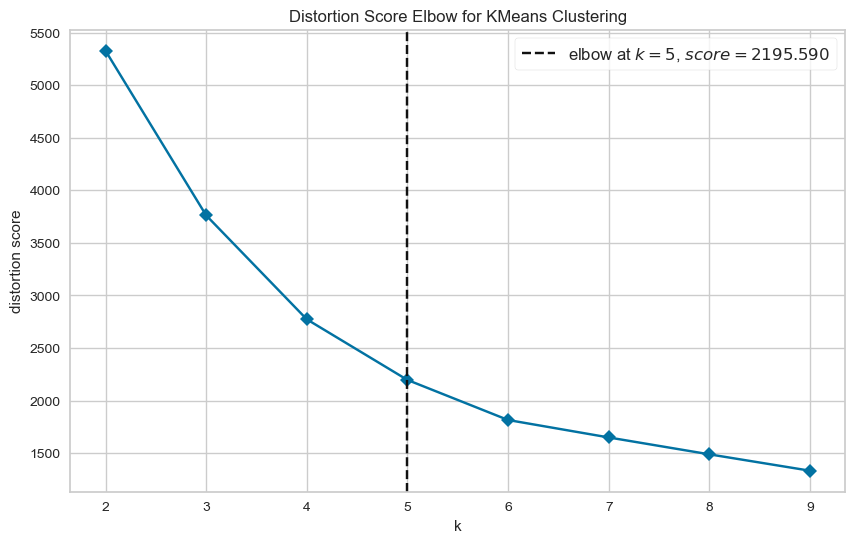

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [18]:

from yellowbrick.cluster import KElbowVisualizer


scaler = StandardScaler()
normalized_data_with_volatility = scaler.fit_transform(weekly_sequences_filtered)

kmeans = KMeans(random_state=42)

plt.figure(figsize=(10, 6))
visualizer = KElbowVisualizer(kmeans, k=(2, 10), timings=False)  
visualizer.fit(normalized_data_with_volatility)
visualizer.show()


## We will check 3 tests on 3 different algorithms

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Silhouette Score for KMEANS (with Volatility): 0.6063328638108904
Davies-Bouldin Index for KMEANS (with Volatility): 0.5903084586548613
Calinski-Harabasz Index for KMEANS (with Volatility): 2737.467003895341


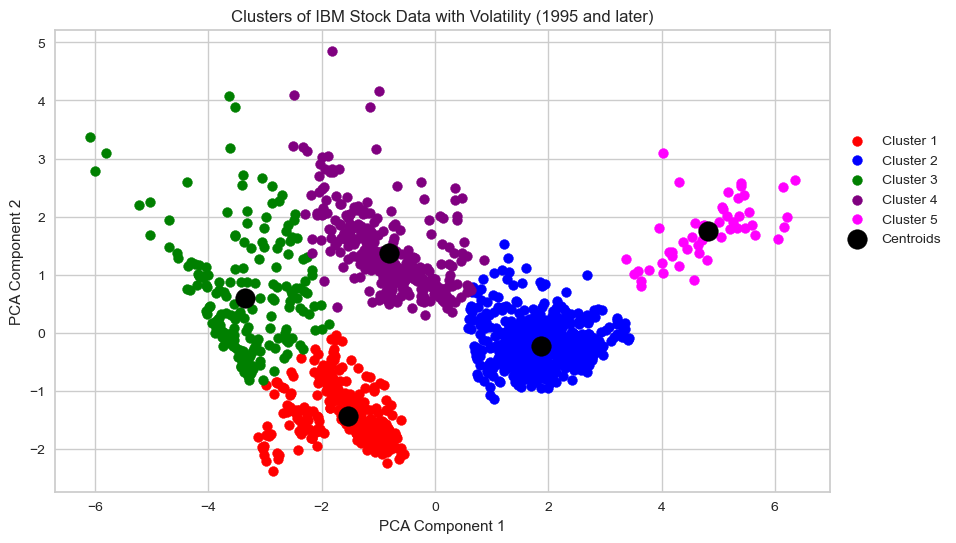

In [19]:

from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score



pca = PCA(n_components=2)
pca_data_with_volatility = pca.fit_transform(normalized_data_with_volatility)

kmeans_with_volatility = KMeans(n_clusters=5, random_state=42)  
kmeans_labels = kmeans_with_volatility.fit_predict(pca_data_with_volatility)

silhouette_avg_for_KMEANS = silhouette_score(pca_data_with_volatility, kmeans_labels)
print(f'Silhouette Score for KMEANS (with Volatility): {silhouette_avg_for_KMEANS}')

davies_bouldin_for_KMEANS = davies_bouldin_score(pca_data_with_volatility, kmeans_labels)
print(f'Davies-Bouldin Index for KMEANS (with Volatility): {davies_bouldin_for_KMEANS}')

calinski_harabasz_for_KMEANS = calinski_harabasz_score(pca_data_with_volatility, kmeans_labels)
print(f'Calinski-Harabasz Index for KMEANS (with Volatility): {calinski_harabasz_for_KMEANS}')

plt.figure(figsize=(10, 6))

plt.scatter(pca_data_with_volatility[kmeans_labels == 0, 0], pca_data_with_volatility[kmeans_labels == 0, 1], s=50, c='red', label='Cluster 1')
plt.scatter(pca_data_with_volatility[kmeans_labels == 1, 0], pca_data_with_volatility[kmeans_labels == 1, 1], s=50, c='blue', label='Cluster 2')
plt.scatter(pca_data_with_volatility[kmeans_labels == 2, 0], pca_data_with_volatility[kmeans_labels == 2, 1], s=50, c='green', label='Cluster 3')
plt.scatter(pca_data_with_volatility[kmeans_labels == 3, 0], pca_data_with_volatility[kmeans_labels == 3, 1], s=50, c='purple', label='Cluster 4')
plt.scatter(pca_data_with_volatility[kmeans_labels == 4, 0], pca_data_with_volatility[kmeans_labels == 4, 1], s=50, c='magenta', label='Cluster 5')

plt.scatter(kmeans_with_volatility.cluster_centers_[:, 0], kmeans_with_volatility.cluster_centers_[:, 1], s=200, c='black', label='Centroids')

plt.title('Clusters of IBM Stock Data with Volatility (1995 and later)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()


## Grid serach

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by set

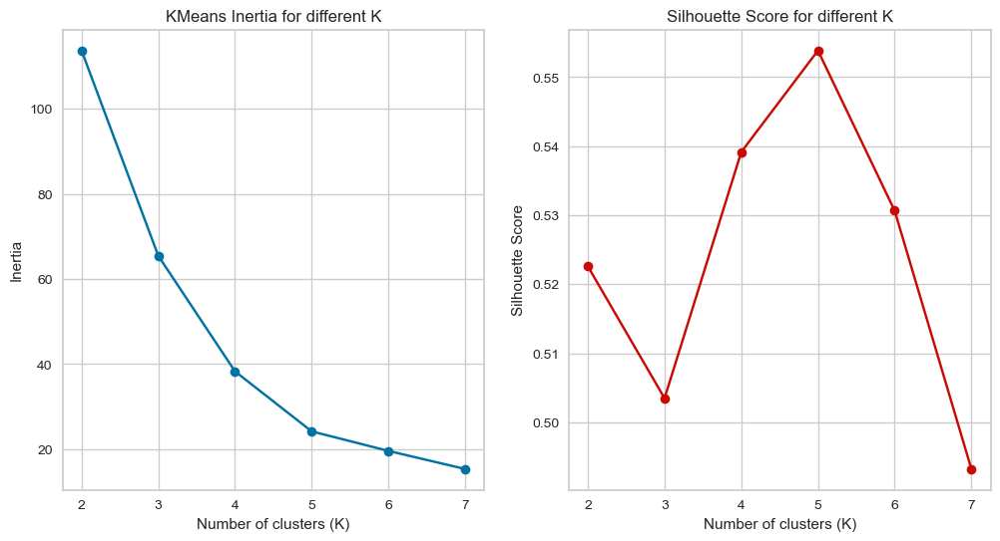

In [44]:
K_range = range(2, 8)
inertia_values = []
silhouette_scores = []

for K in K_range:
    kmeans = KMeans(n_clusters=K, random_state=42)
    kmeans.fit(normalized_data_with_volatility)
    
    inertia_values.append(kmeans.inertia_)
    
    if K > 1:
        score = silhouette_score(normalized_data_with_volatility, kmeans.labels_)
        silhouette_scores.append(score)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(K_range, inertia_values, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia')
plt.title('KMeans Inertia for different K')

plt.subplot(1, 2, 2)
plt.plot(K_range, silhouette_scores, marker='o', color='r')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for different K')

plt.show()


## Good results, especially for the Calinski-Harabasz index, which indicates good cluster compactness

In [21]:
top_10_volatility_weeks = weekly_sequences_filtered[['Volatility (%)']].sort_values(by='Volatility (%)', ascending=False).head(10)

top_10_volatility_weeks


,Volatility (%)
Date,
2020-03-22,8.663434
2008-10-19,8.454138
2008-10-12,8.288404
2008-11-23,7.337115
2001-01-07,7.217779
2008-10-05,7.007356
2020-03-29,6.926680
2008-11-16,6.823329
1997-11-02,6.590184


## 2008 Financial Crisis and the COVID-19 pandemic

In [22]:
cluster_summary = weekly_sequences_filtered.groupby('Cluster').mean()

cluster_summary

,Open,High,Low,Close,Volume,Volatility (%)
Cluster,,,,,,
0,41.568716,42.000757,41.196137,41.595643,6.921389e+06,1.976207
1,109.076306,109.896870,108.283826,109.099741,4.710149e+06,1.497836
2,24.195841,24.616862,23.773148,24.193081,1.451319e+07,3.090138
3,171.826880,173.218639,170.544703,172.008136,4.142020e+06,1.541475
4,64.873997,65.675743,64.138285,64.934712,8.159315e+06,2.449938


In [23]:
weeks_in_cluster = weekly_sequences_filtered[weekly_sequences_filtered['Cluster'] == 4]
weeks_in_cluster

,Open,High,Low,Close,Volume,Cluster,Volatility (%)
Date,,,,,,,
1999-05-09,53.852677,54.701001,53.269155,54.228982,9824743.2,4,2.687946
1999-05-23,60.290306,60.692368,59.415978,59.996737,8645692.2,4,2.148228
1999-05-30,58.264031,59.253235,57.070607,58.468254,10787021.4,4,3.824435
1999-06-06,57.892281,58.690025,56.751508,58.035875,6415876.5,4,3.415798
1999-06-13,59.792510,60.826386,58.816072,59.601051,6019855.4,4,3.417967
...,...,...,...,...,...,...,...
2020-04-05,83.443928,86.042581,82.181635,84.153773,6043411.4,4,4.698064
2020-10-25,94.228702,94.721423,92.717266,93.428621,10561315.6,4,2.161579
2020-11-01,87.202260,88.450700,85.884110,87.137303,7792386.2,4,2.988434


C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


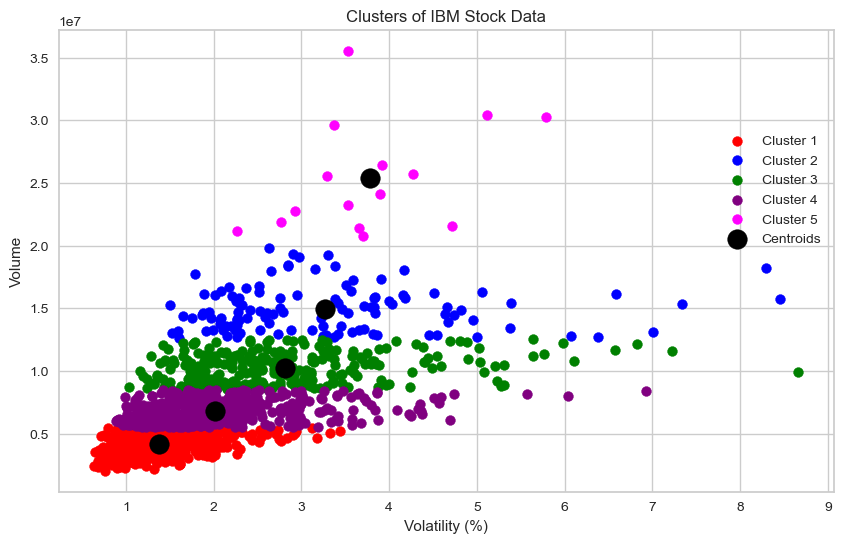

In [24]:

X = weekly_sequences_filtered[['Volatility (%)', 'Volume']].values

kmeans = KMeans(n_clusters=5, random_state=42)
y_kmeans = kmeans.fit_predict(X)

plt.figure(figsize=(10, 6))

plt.scatter(X[y_kmeans == 0, 0], X[y_kmeans == 0, 1], s=50, c='red', label='Cluster 1')

plt.scatter(X[y_kmeans == 1, 0], X[y_kmeans == 1, 1], s=50, c='blue', label='Cluster 2')

# קלאסטר 3
plt.scatter(X[y_kmeans == 2, 0], X[y_kmeans == 2, 1], s=50, c='green', label='Cluster 3')

plt.scatter(X[y_kmeans == 3, 0], X[y_kmeans == 3, 1], s=50, c='purple', label='Cluster 4')

plt.scatter(X[y_kmeans == 4, 0], X[y_kmeans == 4, 1], s=50, c='magenta', label='Cluster 5')





plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='black', label='Centroids')

plt.title('Clusters of IBM Stock Data')
plt.xlabel('Volatility (%)')
plt.ylabel('Volume')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()

In [25]:
silhouette_avg = silhouette_score(X, kmeans.labels_)
silhouette_avg

0.5655128890938748

In [26]:
weekly_sequences_filtered['Cluster'] = y_kmeans

weekly_sequences_filtered[[ 'Volatility (%)', 'Volume', 'Cluster']].head()


C:\Users\אורי בראל\AppData\Local\Temp\ipykernel_6364\3537524553.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekly_sequences_filtered['Cluster'] = y_kmeans


,Volatility (%),Volume,Cluster
Date,,,
1995-01-01,1.838396,6234578.50,3
1995-01-08,1.697795,8863804.25,2
1995-01-15,1.724138,9949803.00,2
1995-01-22,1.703801,9374001.00,2
1995-01-29,2.286905,14034976.80,1


In [27]:
weeks_in_cluster = weekly_sequences_filtered[weekly_sequences_filtered['Cluster'] == 2]
weeks_in_cluster

,Open,High,Low,Close,Volume,Cluster,Volatility (%)
Date,,,,,,,
1995-01-08,9.071923,9.179192,9.025950,9.110233,8863804.25,2,1.697795
1995-01-15,9.332436,9.402927,9.243556,9.329371,9949803.00,2,1.724138
1995-01-22,9.433575,9.513260,9.353889,9.418251,9374001.00,2,1.703801
1995-02-05,8.964654,9.056599,8.875773,8.986108,9601694.20,2,2.037297
1995-03-05,9.256173,9.456058,9.231572,9.391480,11613110.40,2,2.431712
...,...,...,...,...,...,...,...
2021-10-24,114.668998,115.623572,112.898121,113.684438,12495850.80,2,2.414080
2022-01-30,116.623010,118.810849,114.687681,117.638353,10500900.00,2,3.595127
2022-04-24,118.949932,121.283861,117.877687,120.045415,9429140.00,2,2.889583


## We liked seeing the variety across the years. What we tried to avoid was having the weeks categorized within similar timeframes, given the changing prices over different periods

## DBSCAN

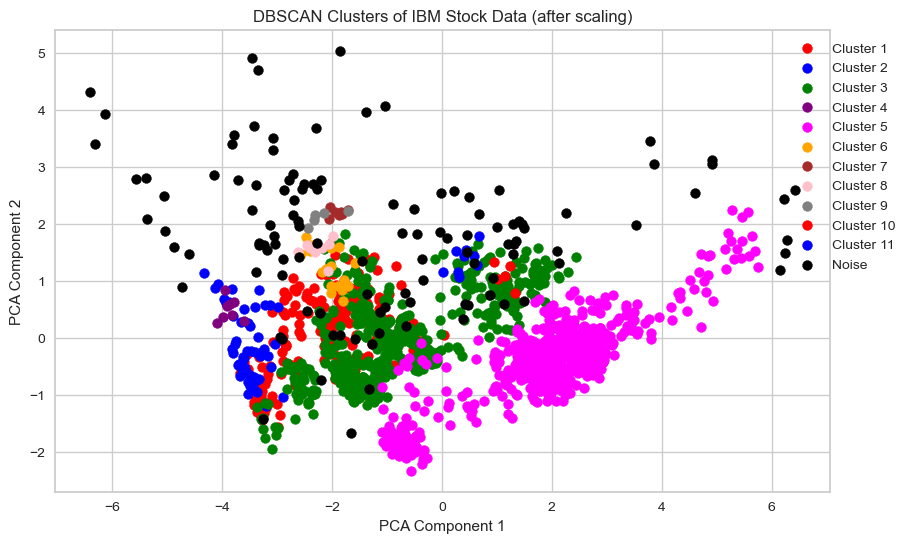

Silhouette Score for DBSCAN: 0.08765400723128562
Davies-Bouldin Index for DBSCAN: 1.862174857827453
Calinski-Harabasz Index for DBSCAN: 183.4846012230796


In [28]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

scaler = StandardScaler()
X_scaled = scaler.fit_transform(weekly_sequences_filtered)

dbscan = DBSCAN(eps=0.5, min_samples=5)  
y_dbscan = dbscan.fit_predict(X_scaled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))

unique_clusters = set(y_dbscan)

colors = ['red', 'blue', 'green', 'purple', 'magenta', 'orange', 'brown', 'pink', 'gray']

for i, cluster in enumerate(unique_clusters):
    if cluster == -1:   
        plt.scatter(X_pca[y_dbscan == cluster, 0], X_pca[y_dbscan == cluster, 1], s=50, c='black', label='Noise')
    else:
        plt.scatter(X_pca[y_dbscan == cluster, 0], X_pca[y_dbscan == cluster, 1], s=50, c=colors[i % len(colors)], label=f'Cluster {cluster+1}')

plt.title('DBSCAN Clusters of IBM Stock Data (after scaling)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1))  
plt.grid(True)
plt.show()

silhouette_avg_for_dbscan = silhouette_score(X_scaled, y_dbscan)
print(f'Silhouette Score for DBSCAN: {silhouette_avg_for_dbscan}')

davies_bouldin_for_dbscan = davies_bouldin_score(X_scaled, y_dbscan)
print(f'Davies-Bouldin Index for DBSCAN: {davies_bouldin_for_dbscan}')

calinski_harabasz_for_dbscan = calinski_harabasz_score(X_scaled, y_dbscan)
print(f'Calinski-Harabasz Index for DBSCAN: {calinski_harabasz_for_dbscan}')


## trying to find the best eps

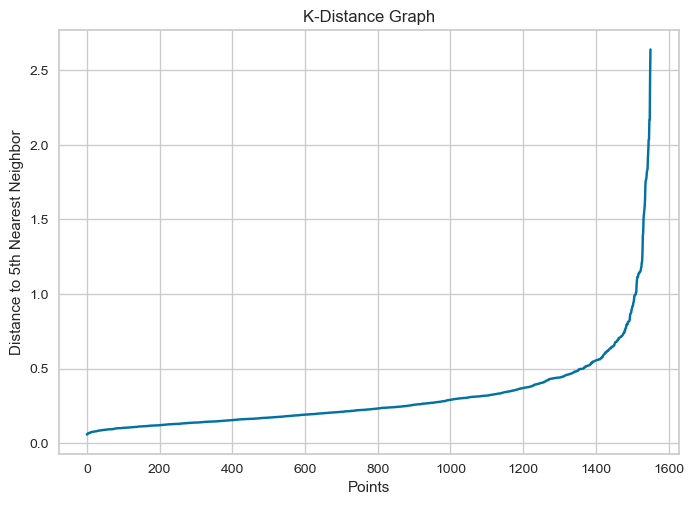

In [29]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

nbrs = NearestNeighbors(n_neighbors=5).fit(X_scaled)
distances, indices = nbrs.kneighbors(X_scaled)

distances = np.sort(distances[:, 4], axis=0)  

plt.plot(distances)
plt.title('K-Distance Graph')
plt.xlabel('Points')
plt.ylabel('Distance to 5th Nearest Neighbor')
plt.grid(True)
plt.show()


## Finding the EPS value using the elbow point identified earlier (5), we can see from the graph that the EPS is between 0.75 and 1. We'll choose 1 and attempt to achieve better results

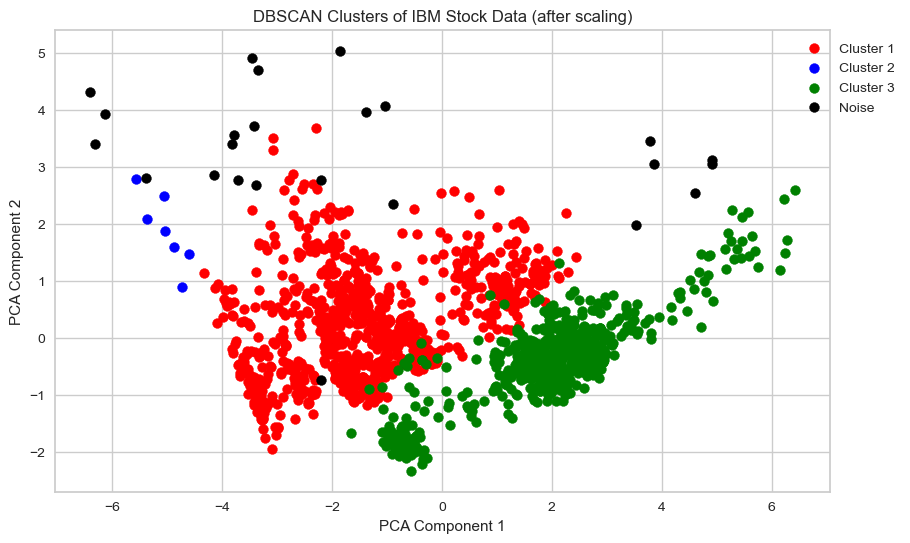

Silhouette Score for DBSCAN: 0.37787674111779174
Davies-Bouldin Index for DBSCAN: 1.5617468762131448
Calinski-Harabasz Index for DBSCAN: 432.77416286182336


In [30]:


scaler = StandardScaler()
X_scaled = scaler.fit_transform(weekly_sequences_filtered)

dbscan = DBSCAN(eps=1, min_samples=5)  
y_dbscan = dbscan.fit_predict(X_scaled)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))

unique_clusters = set(y_dbscan)

colors = ['red', 'blue', 'green', 'purple', 'magenta', 'orange', 'brown', 'pink', 'gray']

for i, cluster in enumerate(unique_clusters):
    if cluster == -1:  
        plt.scatter(X_pca[y_dbscan == cluster, 0], X_pca[y_dbscan == cluster, 1], s=50, c='black', label='Noise')
    else:
        plt.scatter(X_pca[y_dbscan == cluster, 0], X_pca[y_dbscan == cluster, 1], s=50, c=colors[i % len(colors)], label=f'Cluster {cluster+1}')

plt.title('DBSCAN Clusters of IBM Stock Data (after scaling)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1))  
plt.grid(True)
plt.show()

silhouette_avg_for_dbscan = silhouette_score(X_scaled, y_dbscan)
print(f'Silhouette Score for DBSCAN: {silhouette_avg_for_dbscan}')

davies_bouldin_for_dbscan = davies_bouldin_score(X_scaled, y_dbscan)
print(f'Davies-Bouldin Index for DBSCAN: {davies_bouldin_for_dbscan}')

calinski_harabasz_for_dbscan = calinski_harabasz_score(X_scaled, y_dbscan)
print(f'Calinski-Harabasz Index for DBSCAN: {calinski_harabasz_for_dbscan}')


## Results improved

## Agglomerative Clustering

### Bayesian optimization

In [48]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from hyperopt.early_stop import no_progress_loss
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import numpy as np

scaler = StandardScaler()
X_scaled = scaler.fit_transform(weekly_sequences_filtered)

space = {
    'n_clusters': hp.choice('n_clusters', np.arange(2, 11, dtype=int)),
    'linkage': hp.choice('linkage', ['ward', 'complete', 'average'])
}

def objective(params):
    n_clusters = params['n_clusters']
    linkage = params['linkage']
    
    agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage=linkage)
    y_agg = agg_clustering.fit_predict(X_scaled)
    
    score = silhouette_score(X_scaled, y_agg)
    return {'loss': -score, 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=20,
            trials=trials,
            early_stop_fn=no_progress_loss(5))

best_n_clusters = best['n_clusters'] + 2  
best_linkage = ['ward', 'complete', 'average'][best['linkage']]

print(f"Best number of clusters: {best_n_clusters}")
print(f"Best linkage method: {best_linkage}")


  5%|██▍                                             | 1/20 [00:00<00:02,  7.34trial/s, best loss: -0.4821785750330048]

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(



 15%|███████                                        | 3/20 [00:00<00:02,  7.60trial/s, best loss: -0.49390693580594475]

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(



 25%|███████████▊                                   | 5/20 [00:00<00:02,  6.90trial/s, best loss: -0.49390693580594475]

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(



 35%|████████████████▍                              | 7/20 [00:01<00:01,  6.58trial/s, best loss: -0.49390693580594475]

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(



 40%|██████████████████▊                            | 8/20 [00:01<00:01,  6.89trial/s, best loss: -0.49390693580594475]
Best number of clusters: 8
Best linkage method: complete


C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


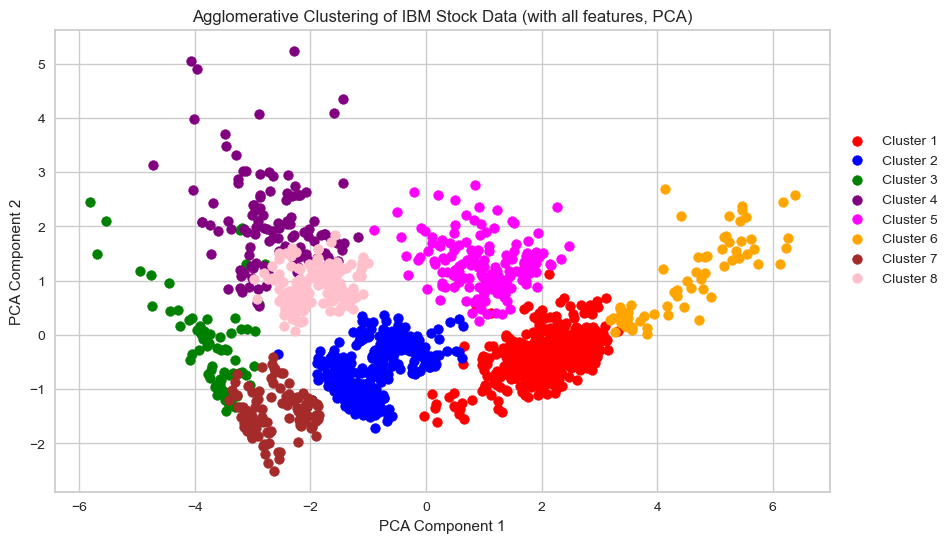

Silhouette Score for Agglomerative Clustering: 0.4673645099273942
Davies-Bouldin Index for Agglomerative Clustering: 0.8591832505012518
Calinski-Harabasz Index for Agglomerative Clustering: 1444.6944779679104


In [51]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

scaler = StandardScaler()
X_scaled = scaler.fit_transform(weekly_sequences_filtered)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

agg_clustering = AgglomerativeClustering(n_clusters=8, affinity='euclidean', linkage='ward')
y_agg = agg_clustering.fit_predict(X_scaled)

plt.figure(figsize=(10, 6))

unique_clusters_agg = set(y_agg)
colors = ['red', 'blue', 'green', 'purple', 'magenta', 'orange', 'brown', 'pink', 'gray']

for i, cluster in enumerate(unique_clusters_agg):
    plt.scatter(X_pca[y_agg == cluster, 0], X_pca[y_agg == cluster, 1], s=50, c=colors[i % len(colors)], label=f'Cluster {cluster+1}')

plt.title('Agglomerative Clustering of IBM Stock Data (with all features, PCA)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()

silhouette_avg_for_agg8 = silhouette_score(X_scaled, y_agg)
print(f'Silhouette Score for Agglomerative Clustering: {silhouette_avg_for_agg8}')

davies_bouldin_for_agg8 = davies_bouldin_score(X_scaled, y_agg)
print(f'Davies-Bouldin Index for Agglomerative Clustering: {davies_bouldin_for_agg8}')

calinski_harabasz_for_agg8 = calinski_harabasz_score(X_scaled, y_agg)
print(f'Calinski-Harabasz Index for Agglomerative Clustering: {calinski_harabasz_for_agg8}')


## number of clusters from the elbow test

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


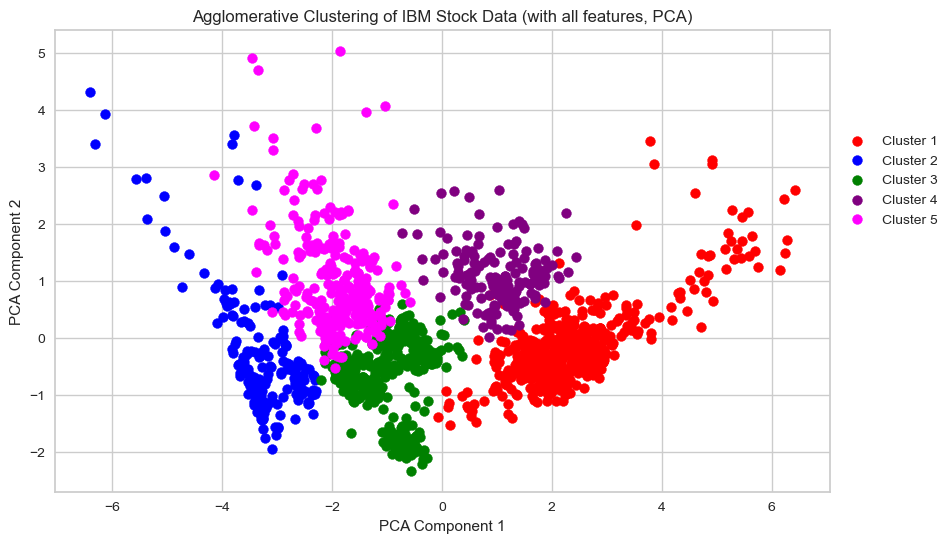

Silhouette Score for Agglomerative Clustering: 0.38192837492579185
Davies-Bouldin Index for Agglomerative Clustering: 1.1221237616828366
Calinski-Harabasz Index for Agglomerative Clustering: 1032.4649604778672


In [31]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

scaler = StandardScaler()
X_scaled = scaler.fit_transform(weekly_sequences_filtered)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

agg_clustering = AgglomerativeClustering(n_clusters=5, affinity='euclidean', linkage='ward')
y_agg = agg_clustering.fit_predict(X_scaled)

plt.figure(figsize=(10, 6))

unique_clusters_agg = set(y_agg)
colors = ['red', 'blue', 'green', 'purple', 'magenta', 'orange', 'brown', 'pink', 'gray']

for i, cluster in enumerate(unique_clusters_agg):
    plt.scatter(X_pca[y_agg == cluster, 0], X_pca[y_agg == cluster, 1], s=50, c=colors[i % len(colors)], label=f'Cluster {cluster+1}')

plt.title('Agglomerative Clustering of IBM Stock Data (with all features, PCA)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()

silhouette_avg_for_agg = silhouette_score(X_scaled, y_agg)
print(f'Silhouette Score for Agglomerative Clustering: {silhouette_avg_for_agg}')

davies_bouldin_for_agg = davies_bouldin_score(X_scaled, y_agg)
print(f'Davies-Bouldin Index for Agglomerative Clustering: {davies_bouldin_for_agg}')

calinski_harabasz_for_agg = calinski_harabasz_score(X_scaled, y_agg)
print(f'Calinski-Harabasz Index for Agglomerative Clustering: {calinski_harabasz_for_agg}')


In [32]:
weekly_sequences_filtered['Cluster'] = y_agg


weeks_in_cluster = weekly_sequences_filtered[weekly_sequences_filtered['Cluster'] == 2]

weeks_in_cluster


C:\Users\אורי בראל\AppData\Local\Temp\ipykernel_6364\998590307.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  weekly_sequences_filtered['Cluster'] = y_agg


,Open,High,Low,Close,Volume,Cluster,Volatility (%)
Date,,,,,,,
1997-12-28,25.708530,26.008798,25.143550,25.412212,5204686.75,2,3.441234
1998-07-19,30.115053,30.457738,29.889768,30.184858,5236150.60,2,1.900213
1998-11-08,37.764726,38.146295,37.367319,37.774341,7488314.00,2,2.084645
1998-11-22,40.460915,40.779229,40.250827,40.492746,7141586.00,2,1.312773
1998-11-29,41.906062,42.737659,41.798632,42.562586,5493382.75,2,2.246551
...,...,...,...,...,...,...,...
2010-12-19,83.963113,84.414204,83.646537,83.999062,5898352.20,2,0.917751
2015-12-20,88.899224,89.368551,87.875239,88.520401,5824839.40,2,1.699355
2016-01-17,85.448443,86.178937,84.566679,85.363110,6165396.00,2,1.906494


### Compare the tests

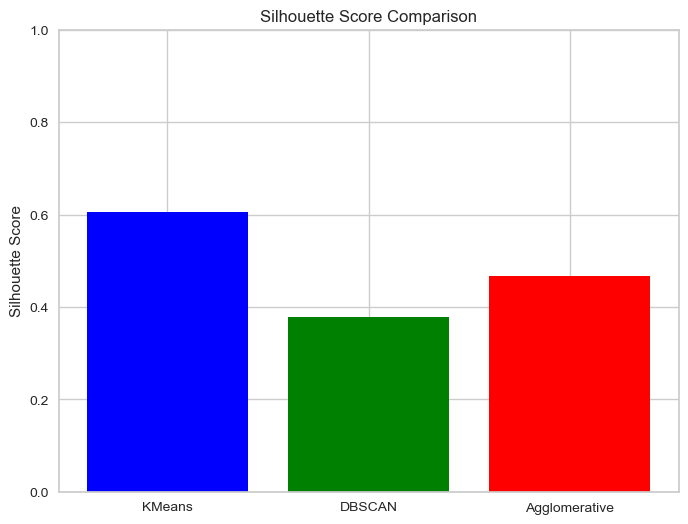

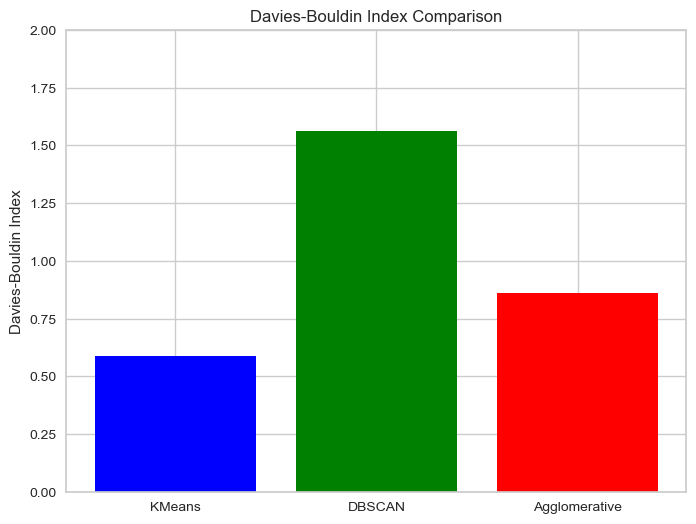

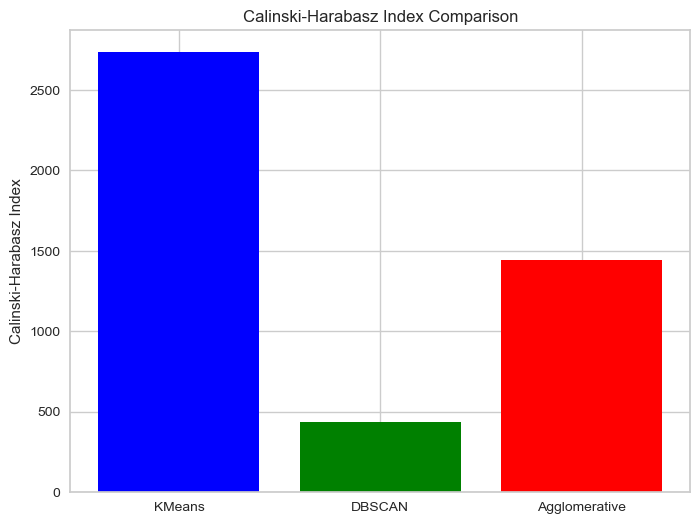

In [52]:

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'DBSCAN', 'Agglomerative'], [silhouette_avg_for_KMEANS, silhouette_avg_for_dbscan, silhouette_avg_for_agg8], color=['blue', 'green', 'red'])
plt.title('Silhouette Score Comparison')
plt.ylabel('Silhouette Score')
plt.ylim(0, 1)
plt.grid(True)

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'DBSCAN', 'Agglomerative'], [davies_bouldin_for_KMEANS, davies_bouldin_for_dbscan, davies_bouldin_for_agg8], color=['blue', 'green', 'red'])
plt.title('Davies-Bouldin Index Comparison')
plt.ylabel('Davies-Bouldin Index')
plt.ylim(0, 2)
plt.grid(True)

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'DBSCAN', 'Agglomerative'], [calinski_harabasz_for_KMEANS, calinski_harabasz_for_dbscan, calinski_harabasz_for_agg8], color=['blue', 'green', 'red'])
plt.title('Calinski-Harabasz Index Comparison')
plt.ylabel('Calinski-Harabasz Index')
plt.grid(True)

plt.show()


### K-means performed the best because it works well with normalized data that is divided into equal time periods. In contrast, Agglomerative Clustering struggled as it performs better with non-symmetrical clusters and is less sensitive to normalization. DBSCAN performed the worst since there are many closely spaced clusters, which creates both noise and too few clusters.

# Division by events (different sequences of time)

In [34]:
df.head()

,Date,Open,High,Low,Close,Volume
0,1964-09-14,1.409715,1.414687,1.365791,1.365791,1079472
1,1964-09-15,1.369935,1.389825,1.369935,1.380709,1004160
2,1964-09-16,1.384025,1.414274,1.384025,1.414274,728016
3,1964-09-17,1.422147,1.443695,1.422147,1.438722,771948
4,1964-09-18,1.438721,1.444523,1.402256,1.410544,809604


In [35]:
df.tail()

,Date,Open,High,Low,Close,Volume
15098,2024-09-09,201.940002,205.050003,201.429993,203.529999,3705000
15099,2024-09-10,204.199997,205.830002,202.869995,205.320007,3070600
15100,2024-09-11,207.759995,210.119995,203.039993,209.889999,5554300
15101,2024-09-12,210.000000,212.649994,208.270004,211.610001,4616400
15102,2024-09-13,212.479996,216.089996,212.130005,214.789993,4571600


## "The 50 Most Influential Events of the Last 60 Years"








In [36]:

# Creating the data for the table
data = {
    'Event': [
        'Cuban Missile Crisis', 'Assassination of John F. Kennedy', 'Vietnam War (U.S. official involvement starts)', 
        'Six-Day War (Middle East Conflict)', 'Apollo 11 Moon Landing', 'Yom Kippur War', '1973 Oil Crisis', 
        'Fall of Saigon (End of Vietnam War)', 'Iranian Revolution', 'Soviet Invasion of Afghanistan', 'Falklands War', 
        'Chernobyl Nuclear Disaster', 'Black Monday (Stock Market Crash)', 'Tiananmen Square Massacre', 
        'Fall of the Berlin Wall', 'Dissolution of the Soviet Union', 'Maastricht Treaty (Creation of the EU)', 
        'Bosnian War', 'World Trade Center Bombing', 'NAFTA Agreement Signed', 'Rwandan Genocide', 
        'Asian Financial Crisis', 'Russian Financial Crisis', 'Dot-Com Bubble Burst', '9/11 World Trade Center Attack', 
        'U.S. Invasion of Afghanistan', 'Enron Scandal', 'U.S. Invasion of Iraq', 'Indian Ocean Tsunami', 'Hurricane Katrina', 
        'Global Financial Crisis (Lehman Brothers collapse)', 'Barack Obama Elected President', 'European Sovereign Debt Crisis', 
        'BP Oil Spill in the Gulf of Mexico', 'Arab Spring (Protests begin in Tunisia)', 'Osama bin Laden Killed', 
        'Syrian Civil War', 'Fukushima Nuclear Disaster', 'Brexit Referendum', 'Donald Trump Elected President', 
        'U.S.-China Trade War (begins)', 'COVID-19 Pandemic (WHO declares pandemic)', 'U.S. Stock Market Crash (Pandemic-related)', 
        'Global COVID-19 Vaccination Campaign Begins', 'George Floyd Protests', 'U.S. Capitol Riots', 'U.S. Withdrawal from Afghanistan', 
        'Russian Invasion of Ukraine', 'Global Energy Crisis (Ukraine War-related)', 'Turkey-Syria Earthquake'
    ],
    'Date': [
        'October 16, 1962', 'November 22, 1963', 'March 8, 1965', 'June 5, 1967', 'July 20, 1969', 'October 6, 1973', 'October 1973',
        'April 30, 1975', 'February 11, 1979', 'December 24, 1979', 'April 2, 1982', 'April 26, 1986', 'October 19, 1987', 
        'June 4, 1989', 'November 9, 1989', 'December 26, 1991', 'February 7, 1992', 'April 6, 1992', 'February 26, 1993', 
        'January 1, 1994', 'April 7, 1994', 'July 2, 1997', 'August 17, 1998', 'March 10, 2000', 'September 11, 2001', 
        'October 7, 2001', 'December 2, 2001', 'March 20, 2003', 'December 26, 2004', 'August 29, 2005', 'September 15, 2008', 
        'November 4, 2008', '2009', 'April 20, 2010', 'December 17, 2010', 'May 2, 2011', 'March 15, 2011', 'March 11, 2011', 
        'June 23, 2016', 'November 8, 2016', 'March 22, 2018', 'March 11, 2020', 'March 16, 2020', 'December 2020', 'May 25, 2020', 
        'January 6, 2021', 'August 15, 2021', 'February 24, 2022', '2022', 'February 6, 2023'
    ]
}

df_50 = pd.DataFrame(data)

df_50


,Event,Date
0,Cuban Missile Crisis,"October 16, 1962"
1,Assassination of John F. Kennedy,"November 22, 1963"
2,Vietnam War (U.S. official involvement starts),"March 8, 1965"
3,Six-Day War (Middle East Conflict),"June 5, 1967"
4,Apollo 11 Moon Landing,"July 20, 1969"
5,Yom Kippur War,"October 6, 1973"
6,1973 Oil Crisis,October 1973
7,Fall of Saigon (End of Vietnam War),"April 30, 1975"
8,Iranian Revolution,"February 11, 1979"
9,Soviet Invasion of Afghanistan,"December 24, 1979"


In [37]:

event_dates = [
    '1965-03-08', '1967-06-05', '1969-07-20', '1973-10-06', '1975-04-30',
    '1979-02-11', '1979-12-24', '1982-04-02', '1986-04-26', '1987-10-19',
    '1989-06-04', '1989-11-09', '1991-12-26', '1992-02-07', '1993-02-26',
    '1994-04-07', '1997-07-02', '1998-08-17', '2000-03-10', '2001-09-11',
    '2001-10-07', '2003-03-20', '2004-12-26', '2005-08-29', '2008-09-15',
    '2008-11-04', '2010-04-20', '2010-12-17', '2011-05-02', '2011-03-15',
    '2016-06-23', '2016-11-08', '2018-03-22', '2020-03-11', '2020-03-16',
    '2020-12-01', '2021-01-06', '2021-08-15', '2022-02-24', '2023-02-06'
]

event_names = [
    'Vietnam War (U.S. official involvement starts)', 'Six-Day War', 'Apollo 11 Moon Landing',
    'Yom Kippur War', 'Fall of Saigon', 'Iranian Revolution', 'Soviet Invasion of Afghanistan',
    'Falklands War', 'Chernobyl Disaster', 'Black Monday', 'Tiananmen Square Massacre',
    'Fall of the Berlin Wall', 'Dissolution of the Soviet Union', 'Maastricht Treaty',
    'World Trade Center Bombing', 'Rwandan Genocide', 'Asian Financial Crisis',
    'Russian Financial Crisis', 'Dot-Com Bubble Burst', '9/11 Attacks', 'U.S. Invasion of Afghanistan',
    'U.S. Invasion of Iraq', 'Indian Ocean Tsunami', 'Hurricane Katrina', 'Global Financial Crisis',
    'Barack Obama Elected', 'BP Oil Spill', 'Arab Spring', 'Osama bin Laden Killed',
    'Syrian Civil War', 'Brexit Referendum', 'Donald Trump Elected', 'U.S.-China Trade War',
    'COVID-19 Pandemic', 'COVID-19 Stock Crash', 'COVID Vaccination Begins', 'George Floyd Protests',
    'U.S. Capitol Riots', 'U.S. Withdrawal from Afghanistan', 'Russian Invasion of Ukraine', 'Turkey-Syria Earthquake'
]

event_dates = pd.to_datetime(event_dates)

event_dates = sorted(set(event_dates))

end_date = pd.to_datetime('2024-09-13')

event_dates = pd.to_datetime(list(event_dates) + [end_date])

df['Event'] = pd.cut(df['Date'], bins=event_dates, labels=event_names[:len(event_dates)-1], duplicates='drop')

event_sequences = df.groupby('Event').mean()

event_sequences


,Date,Open,High,Low,Close,Volume
Event,,,,,,
Vietnam War (U.S. official involvement starts),1966-04-20 12:35:37.102473504,1.770926,1.783133,1.759829,1.771750,4.434818e+05
Six-Day War,1968-06-21 21:17:47.193675888,3.078127,3.098480,3.056838,3.079043,5.028077e+05
Apollo 11 Moon Landing,1971-08-27 09:19:46.478873240,3.640550,3.667635,3.613906,3.640807,7.563674e+05
Yom Kippur War,1974-07-19 02:11:14.430379744,2.935603,2.970319,2.900220,2.932753,9.672857e+05
Fall of Saigon,1977-03-21 08:39:39.916317984,3.834373,3.860752,3.810471,3.835765,1.556182e+06
Iranian Revolution,1979-07-19 08:10:54.545454528,4.679182,4.713220,4.643769,4.676433,1.689488e+06
Soviet Invasion of Afghanistan,1981-02-12 17:41:11.080139392,4.321306,4.365722,4.277862,4.321267,2.332315e+06
Falklands War,1984-04-13 10:05:43.524829632,9.466319,9.546137,9.387133,9.468317,4.556350e+06
Chernobyl Disaster,1987-01-21 20:59:31.200000000,13.061455,13.177655,12.930682,13.047487,7.710075e+06


In [38]:
event_sequences['Date'] = pd.to_datetime(event_sequences['Date'], errors='coerce', utc=True)

event_sequences['Date'] = event_sequences['Date'].dt.tz_localize(None)

event_sequences['Date'] = event_sequences['Date'].dt.normalize()
event_sequences


,Date,Open,High,Low,Close,Volume
Event,,,,,,
Vietnam War (U.S. official involvement starts),1966-04-20,1.770926,1.783133,1.759829,1.771750,4.434818e+05
Six-Day War,1968-06-21,3.078127,3.098480,3.056838,3.079043,5.028077e+05
Apollo 11 Moon Landing,1971-08-27,3.640550,3.667635,3.613906,3.640807,7.563674e+05
Yom Kippur War,1974-07-19,2.935603,2.970319,2.900220,2.932753,9.672857e+05
Fall of Saigon,1977-03-21,3.834373,3.860752,3.810471,3.835765,1.556182e+06
Iranian Revolution,1979-07-19,4.679182,4.713220,4.643769,4.676433,1.689488e+06
Soviet Invasion of Afghanistan,1981-02-12,4.321306,4.365722,4.277862,4.321267,2.332315e+06
Falklands War,1984-04-13,9.466319,9.546137,9.387133,9.468317,4.556350e+06
Chernobyl Disaster,1987-01-21,13.061455,13.177655,12.930682,13.047487,7.710075e+06


In [39]:
event_sequences['Volatility (%)'] = ((event_sequences['High'] - event_sequences['Low']) / event_sequences['Low']) * 100

event_sequences.head()


,Date,Open,High,Low,Close,Volume,Volatility (%)
Event,,,,,,,
Vietnam War (U.S. official involvement starts),1966-04-20,1.770926,1.783133,1.759829,1.771750,4.434818e+05,1.324259
Six-Day War,1968-06-21,3.078127,3.098480,3.056838,3.079043,5.028077e+05,1.362268
Apollo 11 Moon Landing,1971-08-27,3.640550,3.667635,3.613906,3.640807,7.563674e+05,1.486745
Yom Kippur War,1974-07-19,2.935603,2.970319,2.900220,2.932753,9.672857e+05,2.417011
Fall of Saigon,1977-03-21,3.834373,3.860752,3.810471,3.835765,1.556182e+06,1.319553


In [40]:
event_sequences_sorted = event_sequences.sort_values(by='Volatility (%)', ascending=False)

event_sequences_sorted.head(10)


,Date,Open,High,Low,Close,Volume,Volatility (%)
Event,,,,,,,
COVID-19 Pandemic,2020-03-13,81.357084,83.939278,76.665929,79.687917,1.240654e+07,9.487068
Global Financial Crisis,2008-10-10,55.486846,56.961542,53.655919,55.083774,1.314878e+07,6.160782
9/11 Attacks,2001-09-26,48.214632,49.235292,47.539351,48.527675,1.284391e+07,3.567447
Dot-Com Bubble Burst,2000-12-09,55.729160,56.738961,54.820750,55.766162,8.146274e+06,3.499059
Russian Financial Crisis,1999-05-30,51.125099,51.845421,50.250467,51.046599,9.461087e+06,3.174009
U.S. Invasion of Afghanistan,2002-06-28,45.735481,46.359845,45.107402,45.752062,9.341762e+06,2.776578
Asian Financial Crisis,1998-01-24,27.226631,27.583200,26.904053,27.223800,8.733892e+06,2.524329
COVID-19 Stock Crash,2020-07-24,94.639995,95.825599,93.512158,94.641121,5.629828e+06,2.473947
Yom Kippur War,1974-07-19,2.935603,2.970319,2.900220,2.932753,9.672857e+05,2.417011


## Kmeans

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by set

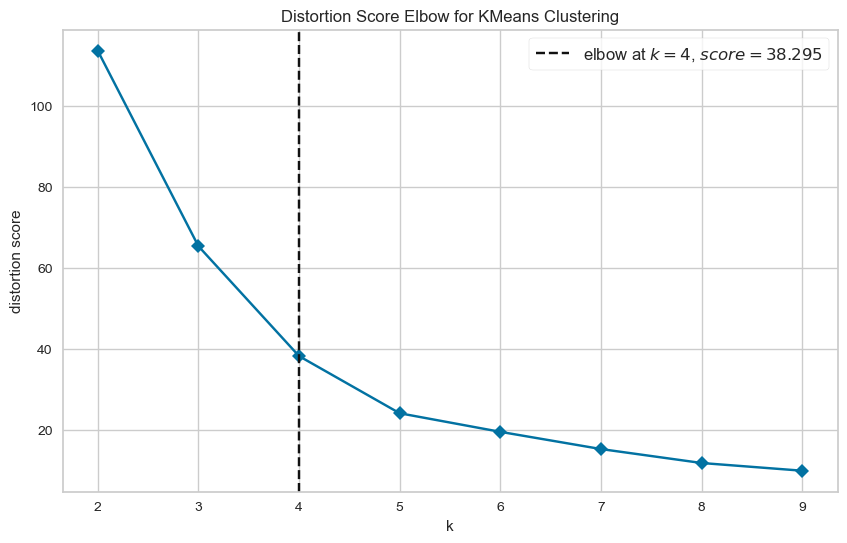

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [53]:
numeric_columns = event_sequences.select_dtypes(include=['float64', 'int64']).columns

scaler = StandardScaler()
normalized_data_with_volatility = scaler.fit_transform(event_sequences[numeric_columns])

kmeans = KMeans(random_state=42)

plt.figure(figsize=(10, 6))
visualizer = KElbowVisualizer(kmeans, k=(2, 10), timings=False)  
visualizer.fit(normalized_data_with_volatility)
visualizer.show()


C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Silhouette Score for KMEANS (K=4): 0.539152722511523
Davies-Bouldin Index for KMEANS (K=4): 0.5785409388466416
Calinski-Harabasz Index for KMEANS (K=4): 63.20506929644113


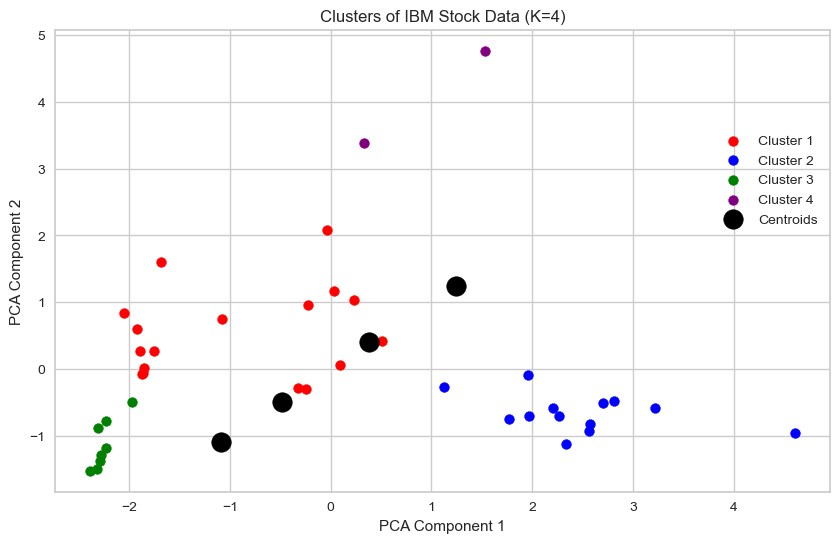

In [54]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt

numeric_columns = event_sequences.select_dtypes(include=['float64', 'int64']).columns
numeric_data = event_sequences[numeric_columns]

scaler = StandardScaler()
normalized_data_with_volatility = scaler.fit_transform(numeric_data)

kmeans_with_volatility = KMeans(n_clusters=4, random_state=42)
kmeans_labels = kmeans_with_volatility.fit_predict(normalized_data_with_volatility)

silhouette_avg_for_KMEANS = silhouette_score(normalized_data_with_volatility, kmeans_labels)
davies_bouldin_for_KMEANS = davies_bouldin_score(normalized_data_with_volatility, kmeans_labels)
calinski_harabasz_for_KMEANS = calinski_harabasz_score(normalized_data_with_volatility, kmeans_labels)

print(f'Silhouette Score for KMEANS (K=4): {silhouette_avg_for_KMEANS}')
print(f'Davies-Bouldin Index for KMEANS (K=4): {davies_bouldin_for_KMEANS}')
print(f'Calinski-Harabasz Index for KMEANS (K=4): {calinski_harabasz_for_KMEANS}')

pca = PCA(n_components=2)
pca_data_with_volatility = pca.fit_transform(normalized_data_with_volatility)

plt.figure(figsize=(10, 6))

plt.scatter(pca_data_with_volatility[kmeans_labels == 0, 0], pca_data_with_volatility[kmeans_labels == 0, 1], s=50, c='red', label='Cluster 1')
plt.scatter(pca_data_with_volatility[kmeans_labels == 1, 0], pca_data_with_volatility[kmeans_labels == 1, 1], s=50, c='blue', label='Cluster 2')
plt.scatter(pca_data_with_volatility[kmeans_labels == 2, 0], pca_data_with_volatility[kmeans_labels == 2, 1], s=50, c='green', label='Cluster 3')
plt.scatter(pca_data_with_volatility[kmeans_labels == 3, 0], pca_data_with_volatility[kmeans_labels == 3, 1], s=50, c='purple', label='Cluster 4')

plt.scatter(kmeans_with_volatility.cluster_centers_[:, 0], kmeans_with_volatility.cluster_centers_[:, 1], s=200, c='black', label='Centroids')

plt.title('Clusters of IBM Stock Data (K=4)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()


In [55]:
event_sequences['Cluster'] = kmeans_labels

for cluster in range(4):
    print(f"\nCluster {cluster}:")
    cluster_data = event_sequences[event_sequences['Cluster'] == cluster]
    print(cluster_data[['Date', 'Cluster']])  



Cluster 0:
                                      Date  Cluster
Event                                              
Chernobyl Disaster              1987-01-21        0
Black Monday                    1988-08-10        0
Tiananmen Square Massacre       1989-08-22        0
Fall of the Berlin Wall         1990-12-04        0
Dissolution of the Soviet Union 1992-01-18        0
Maastricht Treaty               1992-08-18        0
World Trade Center Bombing      1993-09-17        0
Rwandan Genocide                1995-11-20        0
Asian Financial Crisis          1998-01-24        0
Russian Financial Crisis        1999-05-30        0
Dot-Com Bubble Burst            2000-12-09        0
9/11 Attacks                    2001-09-26        0
U.S. Invasion of Afghanistan    2002-06-28        0
U.S. Invasion of Iraq           2004-02-06        0
Indian Ocean Tsunami            2005-04-28        0
Hurricane Katrina               2007-03-08        0
Barack Obama Elected            2009-07-28        0


C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Silhouette Score for KMEANS (K=4, Volatility & Volume): 0.5316941513715705
Davies-Bouldin Index for KMEANS (K=4, Volatility & Volume): 0.5621746402525557
Calinski-Harabasz Index for KMEANS (K=4, Volatility & Volume): 80.49384955544662


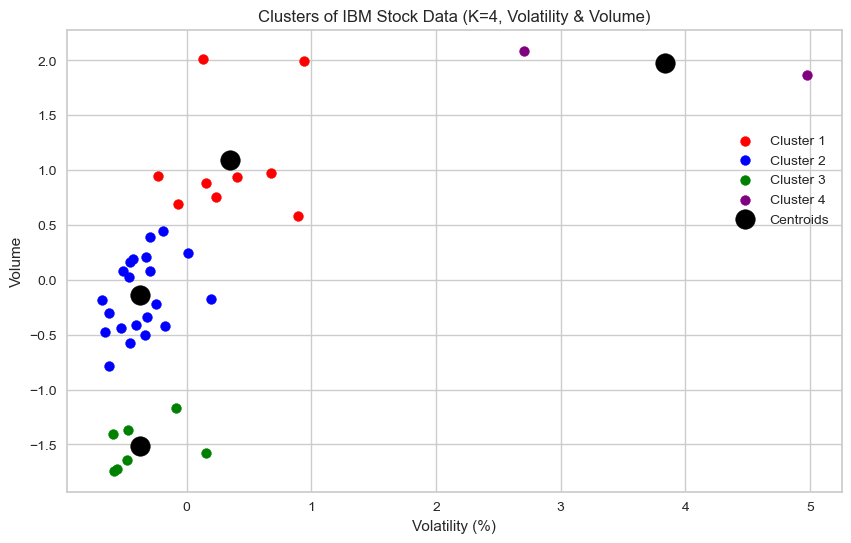


Cluster 0:
                                   Date  Cluster
Event                                           
Maastricht Treaty            1992-08-18        0
World Trade Center Bombing   1993-09-17        0
Rwandan Genocide             1995-11-20        0
Asian Financial Crisis       1998-01-24        0
Russian Financial Crisis     1999-05-30        0
Dot-Com Bubble Burst         2000-12-09        0
9/11 Attacks                 2001-09-26        0
U.S. Invasion of Afghanistan 2002-06-28        0
Barack Obama Elected         2009-07-28        0

Cluster 1:
                                       Date  Cluster
Event                                               
Falklands War                    1984-04-13        1
Chernobyl Disaster               1987-01-21        1
Black Monday                     1988-08-10        1
Tiananmen Square Massacre        1989-08-22        1
Fall of the Berlin Wall          1990-12-04        1
Dissolution of the Soviet Union  1992-01-18        1
U.S. Invasion

In [56]:
selected_columns = ['Volatility (%)', 'Volume']
numeric_data_selected = event_sequences[selected_columns]

scaler = StandardScaler()
normalized_data_selected = scaler.fit_transform(numeric_data_selected)

kmeans_with_volatility_volume = KMeans(n_clusters=4, random_state=42)
kmeans_labels_selected = kmeans_with_volatility_volume.fit_predict(normalized_data_selected)

silhouette_avg_for_KMEANS_selected = silhouette_score(normalized_data_selected, kmeans_labels_selected)
davies_bouldin_for_KMEANS_selected = davies_bouldin_score(normalized_data_selected, kmeans_labels_selected)
calinski_harabasz_for_KMEANS_selected = calinski_harabasz_score(normalized_data_selected, kmeans_labels_selected)

print(f'Silhouette Score for KMEANS (K=4, Volatility & Volume): {silhouette_avg_for_KMEANS_selected}')
print(f'Davies-Bouldin Index for KMEANS (K=4, Volatility & Volume): {davies_bouldin_for_KMEANS_selected}')
print(f'Calinski-Harabasz Index for KMEANS (K=4, Volatility & Volume): {calinski_harabasz_for_KMEANS_selected}')

plt.figure(figsize=(10, 6))

plt.scatter(normalized_data_selected[kmeans_labels_selected == 0, 0], normalized_data_selected[kmeans_labels_selected == 0, 1], s=50, c='red', label='Cluster 1')
plt.scatter(normalized_data_selected[kmeans_labels_selected == 1, 0], normalized_data_selected[kmeans_labels_selected == 1, 1], s=50, c='blue', label='Cluster 2')
plt.scatter(normalized_data_selected[kmeans_labels_selected == 2, 0], normalized_data_selected[kmeans_labels_selected == 2, 1], s=50, c='green', label='Cluster 3')
plt.scatter(normalized_data_selected[kmeans_labels_selected == 3, 0], normalized_data_selected[kmeans_labels_selected == 3, 1], s=50, c='purple', label='Cluster 4')

plt.scatter(kmeans_with_volatility_volume.cluster_centers_[:, 0], kmeans_with_volatility_volume.cluster_centers_[:, 1], s=200, c='black', label='Centroids')

plt.title('Clusters of IBM Stock Data (K=4, Volatility & Volume)')
plt.xlabel('Volatility (%)')
plt.ylabel('Volume')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()

event_sequences['Cluster'] = kmeans_labels_selected

for cluster in range(4):
    print(f"\nCluster {cluster}:")
    cluster_data = event_sequences[event_sequences['Cluster'] == cluster]
    print(cluster_data[['Date', 'Cluster']])  


## We can see on both graphs how unique were the Global Financial Crisis and the COVID-19 Pandemic

# DBSCAN

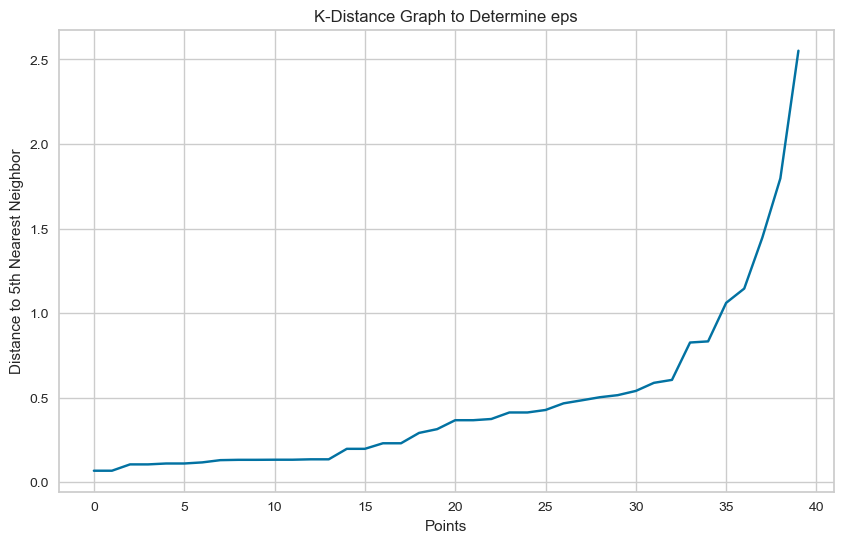

In [57]:
import numpy as np
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

numeric_columns = event_sequences.select_dtypes(include=['float64', 'int64']).columns
numeric_data_selected = event_sequences[numeric_columns]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(numeric_data_selected)

nbrs = NearestNeighbors(n_neighbors=2).fit(X_scaled)
distances, indices = nbrs.kneighbors(X_scaled)

distances = np.sort(distances[:, 1], axis=0)  

plt.figure(figsize=(10, 6))
plt.plot(distances)
plt.title('K-Distance Graph to Determine eps')
plt.xlabel('Points')
plt.ylabel('Distance to 5th Nearest Neighbor')
plt.grid(True)
plt.show()


Silhouette Score for DBSCAN: 0.38134600809294533
Davies-Bouldin Index for DBSCAN: 1.8282579486344415
Calinski-Harabasz Index for DBSCAN: 20.667888369006633


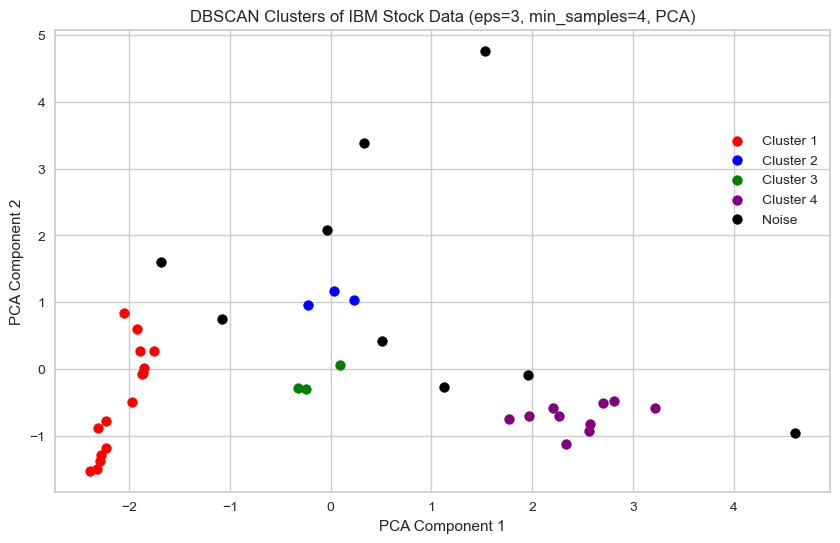


Cluster 0:
                                                     Date  Cluster
Event                                                             
Vietnam War (U.S. official involvement starts) 1966-04-20        0
Six-Day War                                    1968-06-21        0
Apollo 11 Moon Landing                         1971-08-27        0
Yom Kippur War                                 1974-07-19        0
Fall of Saigon                                 1977-03-21        0
Iranian Revolution                             1979-07-19        0
Soviet Invasion of Afghanistan                 1981-02-12        0
Falklands War                                  1984-04-13        0
Chernobyl Disaster                             1987-01-21        0
Black Monday                                   1988-08-10        0
Tiananmen Square Massacre                      1989-08-22        0
Fall of the Berlin Wall                        1990-12-04        0
Dissolution of the Soviet Union                199

In [58]:
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt

scaler = StandardScaler()
X_scaled = scaler.fit_transform(event_sequences.select_dtypes(include=['float64', 'int64']))

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

dbscan = DBSCAN(eps=0.5, min_samples=2)
dbscan_labels = dbscan.fit_predict(X_pca)

silhouette_avg_dbscan = silhouette_score(X_pca, dbscan_labels)
davies_bouldin_dbscan = davies_bouldin_score(X_pca, dbscan_labels)
calinski_harabasz_dbscan = calinski_harabasz_score(X_pca, dbscan_labels)

print(f'Silhouette Score for DBSCAN: {silhouette_avg_dbscan}')
print(f'Davies-Bouldin Index for DBSCAN: {davies_bouldin_dbscan}')
print(f'Calinski-Harabasz Index for DBSCAN: {calinski_harabasz_dbscan}')

plt.figure(figsize=(10, 6))

unique_clusters = set(dbscan_labels)
colors = ['red', 'blue', 'green', 'purple', 'magenta', 'orange', 'brown', 'pink', 'gray']

for i, cluster in enumerate(unique_clusters):
    if cluster == -1:  
        plt.scatter(X_pca[dbscan_labels == cluster, 0], X_pca[dbscan_labels == cluster, 1], s=50, c='black', label='Noise')
    else:
        plt.scatter(X_pca[dbscan_labels == cluster, 0], X_pca[dbscan_labels == cluster, 1], s=50, c=colors[i % len(colors)], label=f'Cluster {cluster+1}')

plt.title('DBSCAN Clusters of IBM Stock Data (eps=3, min_samples=4, PCA)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()

event_sequences['Cluster'] = dbscan_labels

for cluster in unique_clusters:
    print(f"\nCluster {cluster}:")
    cluster_data = event_sequences[event_sequences['Cluster'] == cluster]
    print(cluster_data[['Date', 'Cluster']])  


Silhouette Score for DBSCAN: 0.38134600809294533
Davies-Bouldin Index for DBSCAN: 1.8282579486344415
Calinski-Harabasz Index for DBSCAN: 20.667888369006633


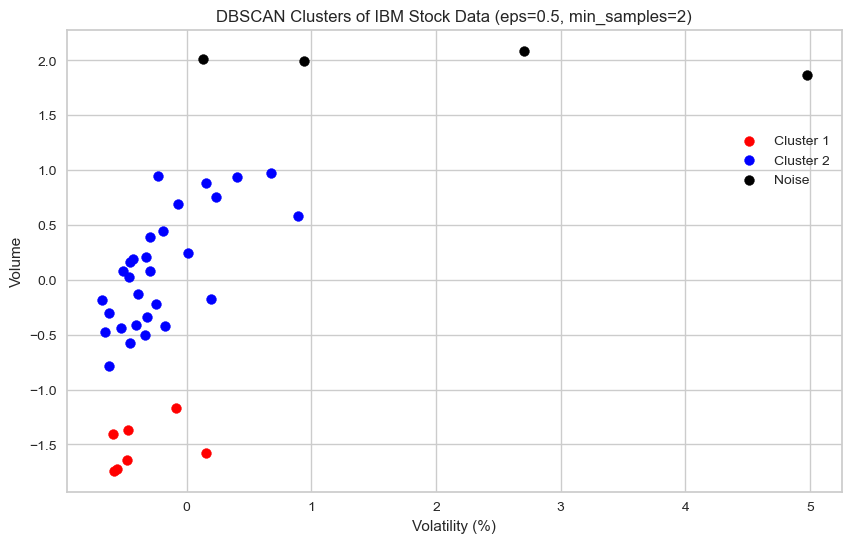


Cluster 0:
                                                     Date  Cluster
Event                                                             
Vietnam War (U.S. official involvement starts) 1966-04-20        0
Six-Day War                                    1968-06-21        0
Apollo 11 Moon Landing                         1971-08-27        0
Yom Kippur War                                 1974-07-19        0
Fall of Saigon                                 1977-03-21        0
Iranian Revolution                             1979-07-19        0
Soviet Invasion of Afghanistan                 1981-02-12        0

Cluster 1:
                                       Date  Cluster
Event                                               
Falklands War                    1984-04-13        1
Chernobyl Disaster               1987-01-21        1
Black Monday                     1988-08-10        1
Tiananmen Square Massacre        1989-08-22        1
Fall of the Berlin Wall          1990-12-04        1
Di

In [59]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt

scaler = StandardScaler()
X_scaled = scaler.fit_transform(event_sequences[['Volatility (%)', 'Volume']])

dbscan = DBSCAN(eps=0.5, min_samples=2)
dbscan_labels = dbscan.fit_predict(X_scaled)

if len(set(dbscan_labels)) > 1:
    silhouette_avg_dbscan_selected = silhouette_score(X_scaled, dbscan_labels)
    davies_bouldin_dbscan_selected = davies_bouldin_score(X_scaled, dbscan_labels)
    calinski_harabasz_dbscan_selected = calinski_harabasz_score(X_scaled, dbscan_labels)


    print(f'Silhouette Score for DBSCAN: {silhouette_avg_dbscan}')
    print(f'Davies-Bouldin Index for DBSCAN: {davies_bouldin_dbscan}')
    print(f'Calinski-Harabasz Index for DBSCAN: {calinski_harabasz_dbscan}')
else:
    print("DBSCAN did not create enough clusters to calculate the scores.")

plt.figure(figsize=(10, 6))

unique_clusters = set(dbscan_labels)
colors = ['red', 'blue', 'green', 'purple', 'magenta', 'orange', 'brown', 'pink', 'gray']

for i, cluster in enumerate(unique_clusters):
    if cluster == -1: 
        plt.scatter(X_scaled[dbscan_labels == cluster, 0], X_scaled[dbscan_labels == cluster, 1], s=50, c='black', label='Noise')
    else:
        plt.scatter(X_scaled[dbscan_labels == cluster, 0], X_scaled[dbscan_labels == cluster, 1], s=50, c=colors[i % len(colors)], label=f'Cluster {cluster+1}')

plt.title('DBSCAN Clusters of IBM Stock Data (eps=0.5, min_samples=2)')
plt.xlabel('Volatility (%)')
plt.ylabel('Volume')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()

event_sequences['Cluster'] = dbscan_labels

for cluster in unique_clusters:
    print(f"\nCluster {cluster}:")
    cluster_data = event_sequences[event_sequences['Cluster'] == cluster]
    print(cluster_data[['Date', 'Cluster']])  


## Agglomerative Clustering

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Silhouette Score for Agglomerative Clustering (PCA): 0.6020351875207004
Davies-Bouldin Index for Agglomerative Clustering (PCA): 0.5270448800331877
Calinski-Harabasz Index for Agglomerative Clustering (PCA): 94.9223970221198


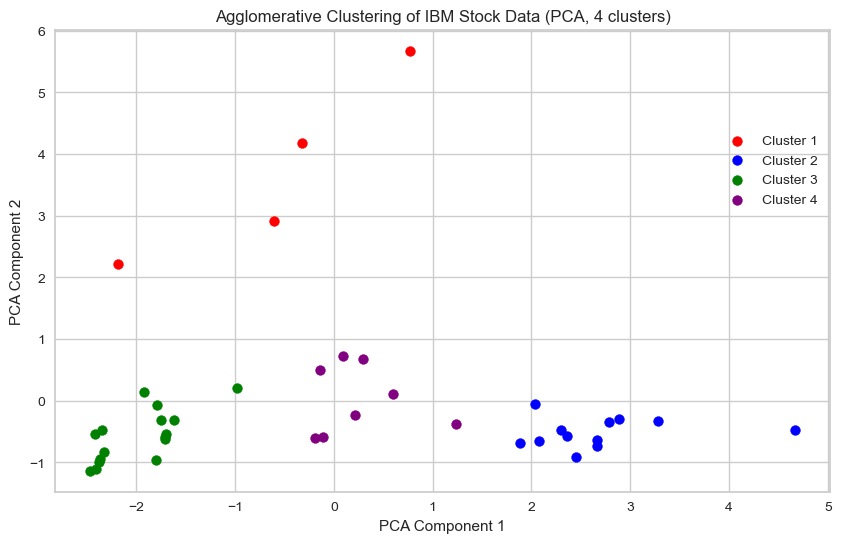


Cluster 0:
                              Date  Cluster
Event                                      
Rwandan Genocide        1995-11-20        0
9/11 Attacks            2001-09-26        0
Global Financial Crisis 2008-10-10        0
COVID-19 Pandemic       2020-03-13        0

Cluster 1:
                                       Date  Cluster
Event                                               
Arab Spring                      2011-01-31        1
Osama bin Laden Killed           2011-04-07        1
Syrian Civil War                 2013-11-27        1
Brexit Referendum                2016-09-01        1
Donald Trump Elected             2017-07-16        1
U.S.-China Trade War             2019-03-17        1
COVID-19 Stock Crash             2020-07-24        1
COVID Vaccination Begins         2020-12-18        1
George Floyd Protests            2021-04-27        1
U.S. Capitol Riots               2021-11-18        1
U.S. Withdrawal from Afghanistan 2022-08-16        1
Russian Invasion of Ukr

In [60]:
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt

scaler = StandardScaler()
X_scaled = scaler.fit_transform(event_sequences.select_dtypes(include=['float64', 'int64']))

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

agg_clustering = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
agg_labels = agg_clustering.fit_predict(X_pca)

silhouette_avg_agg = silhouette_score(X_pca, agg_labels)
davies_bouldin_agg = davies_bouldin_score(X_pca, agg_labels)
calinski_harabasz_agg = calinski_harabasz_score(X_pca, agg_labels)

print(f'Silhouette Score for Agglomerative Clustering (PCA): {silhouette_avg_agg}')
print(f'Davies-Bouldin Index for Agglomerative Clustering (PCA): {davies_bouldin_agg}')
print(f'Calinski-Harabasz Index for Agglomerative Clustering (PCA): {calinski_harabasz_agg}')

plt.figure(figsize=(10, 6))

unique_clusters = set(agg_labels)
colors = ['red', 'blue', 'green', 'purple']

for i, cluster in enumerate(unique_clusters):
    plt.scatter(X_pca[agg_labels == cluster, 0], X_pca[agg_labels == cluster, 1], s=50, c=colors[i % len(colors)], label=f'Cluster {cluster+1}')

plt.title('Agglomerative Clustering of IBM Stock Data (PCA, 4 clusters)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()

event_sequences['Cluster'] = agg_labels

for cluster in unique_clusters:
    print(f"\nCluster {cluster}:")
    cluster_data = event_sequences[event_sequences['Cluster'] == cluster]
    print(cluster_data[['Date', 'Cluster']])  


C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Silhouette Score for Agglomerative Clustering: 0.6020351875207004
Davies-Bouldin Index for Agglomerative Clustering: 0.5270448800331877
Calinski-Harabasz Index for Agglomerative Clustering: 94.9223970221198


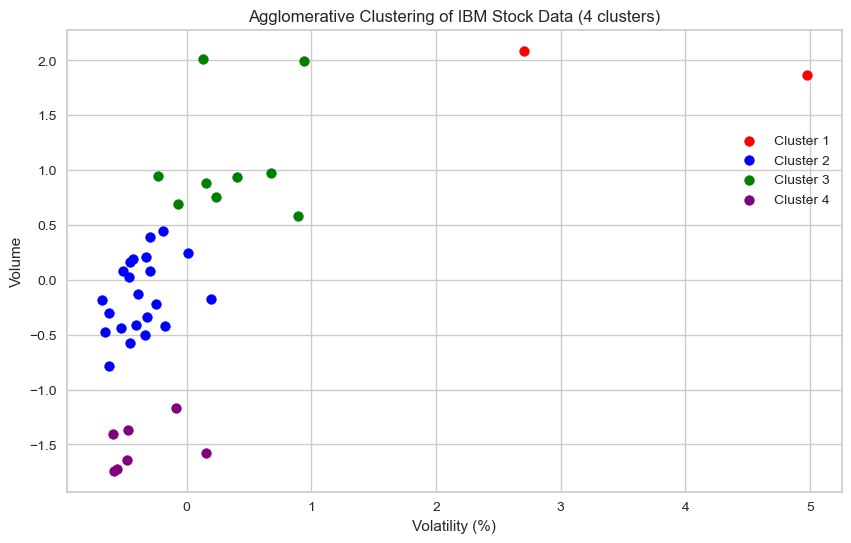


Cluster 0:
                              Date  Cluster
Event                                      
Global Financial Crisis 2008-10-10        0
COVID-19 Pandemic       2020-03-13        0

Cluster 1:
                                       Date  Cluster
Event                                               
Falklands War                    1984-04-13        1
Chernobyl Disaster               1987-01-21        1
Black Monday                     1988-08-10        1
Tiananmen Square Massacre        1989-08-22        1
Fall of the Berlin Wall          1990-12-04        1
Dissolution of the Soviet Union  1992-01-18        1
U.S. Invasion of Iraq            2004-02-06        1
Indian Ocean Tsunami             2005-04-28        1
Hurricane Katrina                2007-03-08        1
BP Oil Spill                     2010-08-19        1
Arab Spring                      2011-01-31        1
Osama bin Laden Killed           2011-04-07        1
Syrian Civil War                 2013-11-27        1
Brexi

In [61]:
X_selected = event_sequences[['Volatility (%)', 'Volume']]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_selected)

agg_clustering = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
agg_labels = agg_clustering.fit_predict(X_scaled)

silhouette_avg_agg_selected = silhouette_score(X_scaled, agg_labels)
davies_bouldin_agg_selected = davies_bouldin_score(X_scaled, agg_labels)
calinski_harabasz_agg_selected = calinski_harabasz_score(X_scaled, agg_labels)

print(f'Silhouette Score for Agglomerative Clustering: {silhouette_avg_agg}')
print(f'Davies-Bouldin Index for Agglomerative Clustering: {davies_bouldin_agg}')
print(f'Calinski-Harabasz Index for Agglomerative Clustering: {calinski_harabasz_agg}')

plt.figure(figsize=(10, 6))

unique_clusters = set(agg_labels)
colors = ['red', 'blue', 'green', 'purple']

for i, cluster in enumerate(unique_clusters):
    plt.scatter(X_scaled[agg_labels == cluster, 0], X_scaled[agg_labels == cluster, 1], s=50, c=colors[i % len(colors)], label=f'Cluster {cluster+1}')

plt.title('Agglomerative Clustering of IBM Stock Data (4 clusters)')
plt.xlabel('Volatility (%)')
plt.ylabel('Volume')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()

event_sequences['Cluster'] = agg_labels

for cluster in unique_clusters:
    print(f"\nCluster {cluster}:")
    cluster_data = event_sequences[event_sequences['Cluster'] == cluster]
    print(cluster_data[['Date', 'Cluster']])   


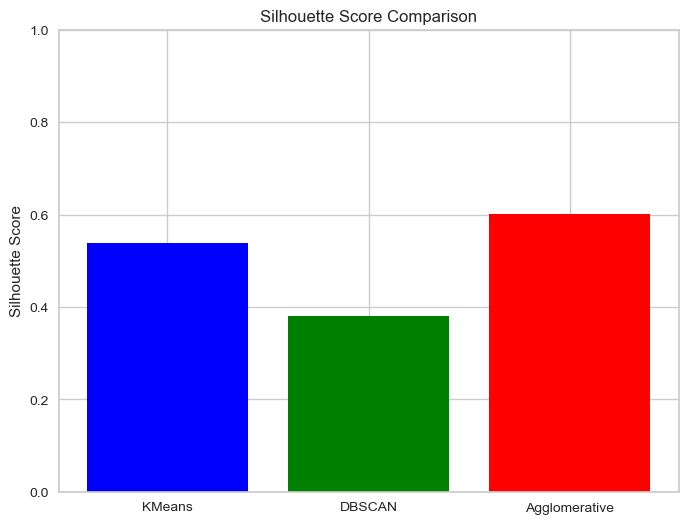

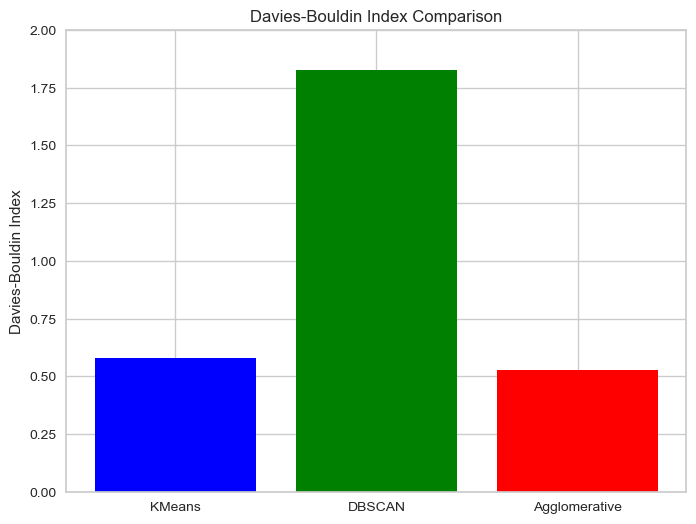

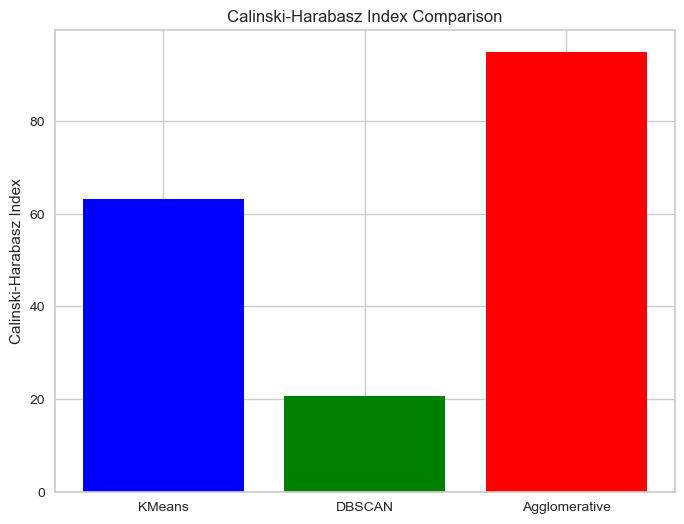

In [62]:

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'DBSCAN', 'Agglomerative'], [silhouette_avg_for_KMEANS, silhouette_avg_dbscan, silhouette_avg_agg], color=['blue', 'green', 'red'])
plt.title('Silhouette Score Comparison')
plt.ylabel('Silhouette Score')
plt.ylim(0, 1)
plt.grid(True)

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'DBSCAN', 'Agglomerative'], [davies_bouldin_for_KMEANS, davies_bouldin_dbscan, davies_bouldin_agg], color=['blue', 'green', 'red'])
plt.title('Davies-Bouldin Index Comparison')
plt.ylabel('Davies-Bouldin Index')
plt.ylim(0, 2)
plt.grid(True)

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'DBSCAN', 'Agglomerative'], [calinski_harabasz_for_KMEANS, calinski_harabasz_dbscan, calinski_harabasz_agg], color=['blue', 'green', 'red'])
plt.title('Calinski-Harabasz Index Comparison')
plt.ylabel('Calinski-Harabasz Index')
plt.grid(True)

plt.show()


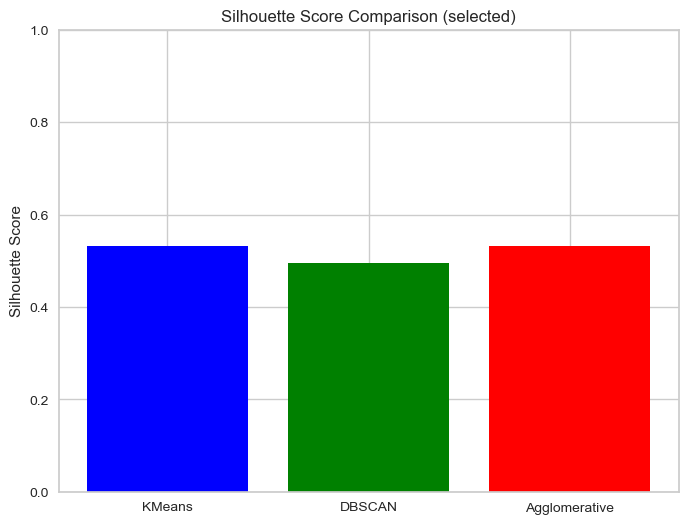

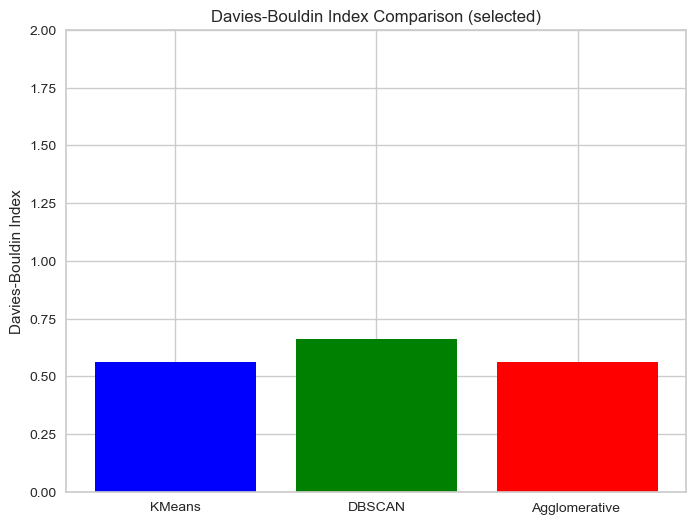

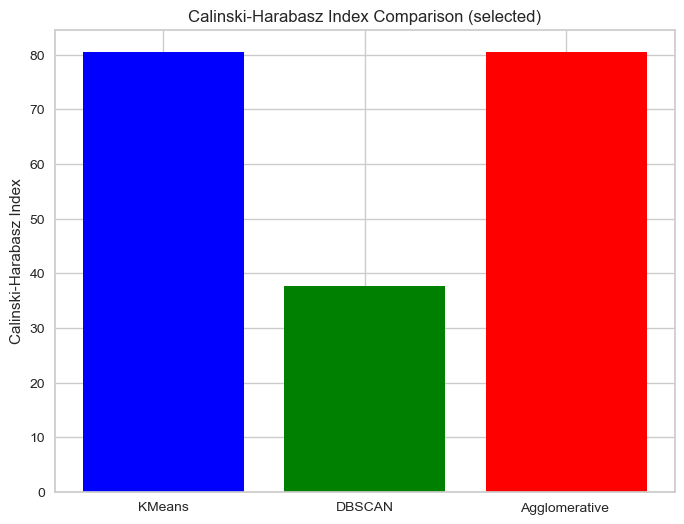

In [63]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'DBSCAN', 'Agglomerative'], [silhouette_avg_for_KMEANS_selected, silhouette_avg_dbscan_selected, silhouette_avg_agg_selected], color=['blue', 'green', 'red'])
plt.title('Silhouette Score Comparison (selected)')
plt.ylabel('Silhouette Score')
plt.ylim(0, 1)
plt.grid(True)

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'DBSCAN', 'Agglomerative '], [davies_bouldin_for_KMEANS_selected, davies_bouldin_dbscan_selected, davies_bouldin_agg_selected], color=['blue', 'green', 'red'])
plt.title('Davies-Bouldin Index Comparison (selected)')
plt.ylabel('Davies-Bouldin Index')
plt.ylim(0, 2)
plt.grid(True)

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'DBSCAN', 'Agglomerative '], [calinski_harabasz_for_KMEANS_selected, calinski_harabasz_dbscan_selected, calinski_harabasz_agg_selected], color=['blue', 'green', 'red'])
plt.title('Calinski-Harabasz Index Comparison (selected)')
plt.ylabel('Calinski-Harabasz Index')
plt.grid(True)

plt.show()


### In conclusion, Agglomerative Clustering was more effective at separating the clusters because it better handles the complexity of the data, making it suitable for non-spherical and unbalanced clusters. KMeans performed reasonably well but was limited by its assumptions about the shape of clusters. DBSCAN, however, was less suitable for the data due to the noise and lack of distinct clusters, or potentially suboptimal parameter choices.



## sequences by the graph 

In [64]:
df_1995 =df[df['Date'] >= '1995-01-01']
df_1995.head()

,Date,Open,High,Low,Close,Volume,Event
7626,1995-01-03,9.010625,9.056598,8.995301,9.041273,4886494,Rwandan Genocide
7627,1995-01-04,9.056601,9.148545,8.979980,9.117898,8345825,Rwandan Genocide
7628,1995-01-05,9.117894,9.225163,9.041273,9.071921,9501446,Rwandan Genocide
7629,1995-01-06,9.102570,9.286460,9.087245,9.209839,12721452,Rwandan Genocide
7630,1995-01-09,9.194514,9.301783,9.179189,9.255811,7167192,Rwandan Genocide


In [65]:

df_1995['Close_diff'] = df_1995['Close'].diff()

df_1995['Trend'] = df_1995['Close_diff'].apply(lambda x: 1 if x > 0 else (-1 if x < 0 else 0))

sequences = []
current_sequence = []
current_trend = None

for i in range(1, len(df_1995)):
    trend = df_1995.iloc[i]['Trend']

    if current_trend is None or trend != current_trend:
        if len(current_sequence) >= 2:
            sequences.append(current_sequence)  
        current_sequence = [df_1995.iloc[i]['Date']]
        current_trend = trend
    else:
        current_sequence.append(df_1995.iloc[i]['Date'])

if len(current_sequence) >= 2:
    sequences.append(current_sequence)
    
sequences



C:\Users\אורי בראל\AppData\Local\Temp\ipykernel_6364\695540469.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1995['Close_diff'] = df_1995['Close'].diff()
C:\Users\אורי בראל\AppData\Local\Temp\ipykernel_6364\695540469.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_1995['Trend'] = df_1995['Close_diff'].apply(lambda x: 1 if x > 0 else (-1 if x < 0 else 0))


[[Timestamp('1995-01-06 00:00:00'),
  Timestamp('1995-01-09 00:00:00'),
  Timestamp('1995-01-10 00:00:00')],
 [Timestamp('1995-01-13 00:00:00'), Timestamp('1995-01-16 00:00:00')],
 [Timestamp('1995-01-18 00:00:00'),
  Timestamp('1995-01-19 00:00:00'),
  Timestamp('1995-01-20 00:00:00'),
  Timestamp('1995-01-23 00:00:00'),
  Timestamp('1995-01-24 00:00:00'),
  Timestamp('1995-01-25 00:00:00')],
 [Timestamp('1995-01-31 00:00:00'),
  Timestamp('1995-02-01 00:00:00'),
  Timestamp('1995-02-02 00:00:00'),
  Timestamp('1995-02-03 00:00:00'),
  Timestamp('1995-02-06 00:00:00')],
 [Timestamp('1995-02-16 00:00:00'),
  Timestamp('1995-02-17 00:00:00'),
  Timestamp('1995-02-21 00:00:00')],
 [Timestamp('1995-02-22 00:00:00'), Timestamp('1995-02-23 00:00:00')],
 [Timestamp('1995-02-28 00:00:00'),
  Timestamp('1995-03-01 00:00:00'),
  Timestamp('1995-03-02 00:00:00'),
  Timestamp('1995-03-03 00:00:00'),
  Timestamp('1995-03-06 00:00:00')],
 [Timestamp('1995-03-09 00:00:00'),
  Timestamp('1995-03-10 0

In [66]:
sequences

[[Timestamp('1995-01-06 00:00:00'),
  Timestamp('1995-01-09 00:00:00'),
  Timestamp('1995-01-10 00:00:00')],
 [Timestamp('1995-01-13 00:00:00'), Timestamp('1995-01-16 00:00:00')],
 [Timestamp('1995-01-18 00:00:00'),
  Timestamp('1995-01-19 00:00:00'),
  Timestamp('1995-01-20 00:00:00'),
  Timestamp('1995-01-23 00:00:00'),
  Timestamp('1995-01-24 00:00:00'),
  Timestamp('1995-01-25 00:00:00')],
 [Timestamp('1995-01-31 00:00:00'),
  Timestamp('1995-02-01 00:00:00'),
  Timestamp('1995-02-02 00:00:00'),
  Timestamp('1995-02-03 00:00:00'),
  Timestamp('1995-02-06 00:00:00')],
 [Timestamp('1995-02-16 00:00:00'),
  Timestamp('1995-02-17 00:00:00'),
  Timestamp('1995-02-21 00:00:00')],
 [Timestamp('1995-02-22 00:00:00'), Timestamp('1995-02-23 00:00:00')],
 [Timestamp('1995-02-28 00:00:00'),
  Timestamp('1995-03-01 00:00:00'),
  Timestamp('1995-03-02 00:00:00'),
  Timestamp('1995-03-03 00:00:00'),
  Timestamp('1995-03-06 00:00:00')],
 [Timestamp('1995-03-09 00:00:00'),
  Timestamp('1995-03-10 0

## Using distance matrix insted of mean

In [67]:
cleaned_sequences = []

for seq in sequences:
    if len(seq) > 1:
        start_date = seq[0]  
        end_date = seq[-1]   
        trend = 1 if df_1995.loc[df_1995['Date'] == start_date, 'Close'].values[0] < df_1995.loc[df_1995['Date'] == end_date, 'Close'].values[0] else -1  # מגמה (עליה או ירידה)
        cleaned_sequences.append([start_date, end_date, trend])

sequences_df = pd.DataFrame(cleaned_sequences, columns=['Start Date', 'End Date', 'Trend'])

sequences_df['Trend Type'] = sequences_df['Trend'].apply(lambda x: 'Up' if x == 1 else 'Down')

sequences_df['Open Price'] = sequences_df['Start Date'].apply(lambda x: df_1995.loc[df_1995['Date'] == x, 'Open'].values[0])
sequences_df['Close Price'] = sequences_df['End Date'].apply(lambda x: df_1995.loc[df_1995['Date'] == x, 'Close'].values[0])
sequences_df['Average Volume'] = sequences_df.apply(lambda row: df_1995.loc[(df_1995['Date'] >= row['Start Date']) & (df_1995['Date'] <= row['End Date']), 'Volume'].mean(), axis=1)

sequences_df['Distance'] = sequences_df.apply(lambda row: abs(row['Close Price'] - row['Open Price']), axis=1)

sequences_df['Distance (%)'] = sequences_df.apply(lambda row: ((row['Close Price'] - row['Open Price']) / row['Open Price']) * 100, axis=1)

sequences_df.head()


,Start Date,End Date,Trend,Trend Type,Open Price,Close Price,Average Volume,Distance,Distance (%)
0,1995-01-06,1995-01-10,1,Up,9.102570,9.393733,1.140042e+07,0.291163,3.198692
1,1995-01-13,1995-01-16,1,Up,9.409060,9.501001,9.929260e+06,0.091942,0.977159
2,1995-01-18,1995-01-25,-1,Down,9.516324,8.872710,1.310164e+07,0.643614,-6.763264
3,1995-01-31,1995-02-06,1,Up,8.826738,9.148545,9.546131e+06,0.321807,3.645820
4,1995-02-16,1995-02-21,-1,Down,9.333051,9.133171,8.615414e+06,0.199880,-2.141636


In [68]:
sequences_df.tail(20)


,Start Date,End Date,Trend,Trend Type,Open Price,Close Price,Average Volume,Distance,Distance (%)
1842,2024-05-15,2024-05-22,1,Up,166.483899,172.184036,3.899750e+06,5.700137,3.423837
1843,2024-05-28,2024-05-30,-1,Down,168.962216,164.193924,3.563033e+06,4.768292,-2.822106
1844,2024-06-04,2024-06-10,1,Up,163.172860,168.902740,2.954180e+06,5.729881,3.511540
1845,2024-06-11,2024-06-12,-1,Down,168.506210,167.534698,3.237000e+06,0.971512,-0.576543
1846,2024-06-13,2024-06-20,1,Up,167.544609,172.412048,3.530540e+06,4.867439,2.905160
1847,2024-06-25,2024-06-27,-1,Down,173.621471,169.368668,3.264100e+06,4.252803,-2.449469
1848,2024-06-28,2024-07-02,1,Up,169.368672,175.762741,3.465867e+06,6.394070,3.775237
1849,2024-07-05,2024-07-08,1,Up,174.216264,176.099792,2.294500e+06,1.883528,1.081144
1850,2024-07-10,2024-07-17,1,Up,175.068811,185.824738,3.596683e+06,10.755927,6.143828
1851,2024-07-18,2024-07-19,-1,Down,185.021761,181.661148,3.651900e+06,3.360613,-1.816334


In [69]:
sequences_df['Distance (%)'] = sequences_df.apply(lambda row: ((df_1995.loc[df_1995['Date'] == row['End Date'], 'Close'].values[0] - 
                                                               df_1995.loc[df_1995['Date'] == row['Start Date'], 'Close'].values[0]) / 
                                                              df_1995.loc[df_1995['Date'] == row['Start Date'], 'Close'].values[0]) * 100, axis=1)

sequences_df.head()

,Start Date,End Date,Trend,Trend Type,Open Price,Close Price,Average Volume,Distance,Distance (%)
0,1995-01-06,1995-01-10,1,Up,9.102570,9.393733,1.140042e+07,0.291163,1.996714
1,1995-01-13,1995-01-16,1,Up,9.409060,9.501001,9.929260e+06,0.091942,1.472961
2,1995-01-18,1995-01-25,-1,Down,9.516324,8.872710,1.310164e+07,0.643614,-6.310662
3,1995-01-31,1995-02-06,1,Up,8.826738,9.148545,9.546131e+06,0.321807,3.466186
4,1995-02-16,1995-02-21,-1,Down,9.333051,9.133171,8.615414e+06,0.199880,-1.655589


In [70]:
top_10_sequences = sequences_df.sort_values(by='Distance (%)', ascending=False).head(10)
top_10_sequences

,Start Date,End Date,Trend,Trend Type,Open Price,Close Price,Average Volume,Distance,Distance (%)
258,1999-04-20,1999-04-27,1,Up,42.583197,54.057728,2.220895e+07,11.474531,24.889585
62,1996-01-16,1996-01-24,1,Up,10.425645,13.260550,3.029114e+07,2.834904,22.988471
383,2001-04-16,2001-04-20,1,Up,49.514571,59.103489,1.622170e+07,9.588918,18.687289
89,1996-07-24,1996-07-31,1,Up,11.168430,13.395885,1.919424e+07,2.227454,17.166206
312,2000-03-16,2000-03-27,1,Up,55.837776,64.994659,8.555443e+06,9.156883,16.399083
368,2001-01-17,2001-01-19,1,Up,49.034049,57.195637,1.734062e+07,8.161587,15.061317
469,2002-08-13,2002-08-19,1,Up,37.169431,42.852612,1.005932e+07,5.683180,14.728711
109,1996-11-13,1996-11-19,1,Up,16.734068,19.319395,2.073364e+07,2.585327,14.378519
294,1999-12-01,1999-12-08,1,Up,52.484745,60.528572,9.697780e+06,8.043827,14.367733
243,1998-12-17,1998-12-28,1,Up,42.128878,48.192760,7.494172e+06,6.063882,13.963108


In [71]:
top_10_absolute_sequences = sequences_df.reindex(sequences_df['Distance (%)'].abs().sort_values(ascending=False).index).head(10)
top_10_absolute_sequences

,Start Date,End Date,Trend,Trend Type,Open Price,Close Price,Average Volume,Distance,Distance (%)
258,1999-04-20,1999-04-27,1,Up,42.583197,54.057728,2.220895e+07,11.474531,24.889585
62,1996-01-16,1996-01-24,1,Up,10.425645,13.260550,3.029114e+07,2.834904,22.988471
624,2005-04-01,2005-04-20,-1,Down,48.440895,38.126881,1.034230e+07,10.314015,-20.378166
856,2008-10-01,2008-10-10,-1,Down,64.071856,48.673752,1.583113e+07,15.398104,-20.321444
383,2001-04-16,2001-04-20,1,Up,49.514571,59.103489,1.622170e+07,9.588918,18.687289
475,2002-09-16,2002-09-24,-1,Down,37.403170,31.039457,1.267458e+07,6.363713,-17.381033
89,1996-07-24,1996-07-31,1,Up,11.168430,13.395885,1.919424e+07,2.227454,17.166206
312,2000-03-16,2000-03-27,1,Up,55.837776,64.994659,8.555443e+06,9.156883,16.399083
368,2001-01-17,2001-01-19,1,Up,49.034049,57.195637,1.734062e+07,8.161587,15.061317
288,1999-10-20,1999-10-21,-1,Down,55.513270,46.505917,4.226959e+07,9.007354,-14.953313


C:\Users\אורי בראל\AppData\Local\Temp\ipykernel_6364\2778795888.py:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


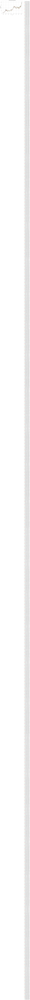

In [72]:
plt.figure(figsize=(10, 6))

for _, row in sequences_df.iterrows():
    start_date = row['Start Date']
    end_date = row['End Date']
    sequence_data = df_1995[(df_1995['Date'] >= start_date) & (df_1995['Date'] <= end_date)]
    plt.plot(sequence_data['Date'], sequence_data['Close'], label=f'{start_date.date()} to {end_date.date()}')

plt.title('Closing Prices Across Sequences')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.xticks(rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left') 
plt.tight_layout()

plt.show()


C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._chec

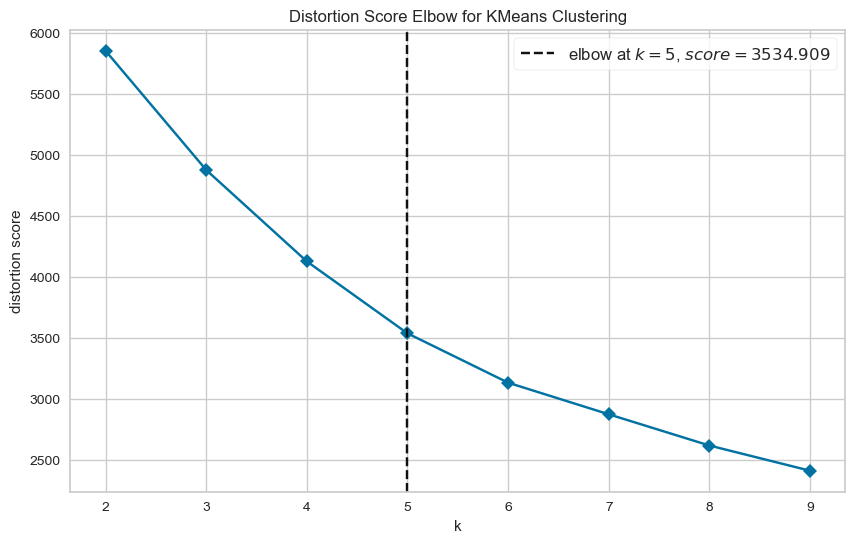

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [73]:
numeric_data = sequences_df.drop(columns=['Start Date', 'End Date', 'Trend Type','Trend'])

scaler = StandardScaler()
normalized_data = scaler.fit_transform(numeric_data)

kmeans = KMeans(random_state=42)

plt.figure(figsize=(10, 6))
visualizer = KElbowVisualizer(kmeans, k=(2, 10), timings=False)  
visualizer.fit(normalized_data)
visualizer.show()

## Kmeans

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Silhouette Score for KMEANS (K=5): 0.5655128890938748
Davies-Bouldin Index for KMEANS (K=5): 0.8774831433554079
Calinski-Harabasz Index for KMEANS (K=5): 1555.1067834031937


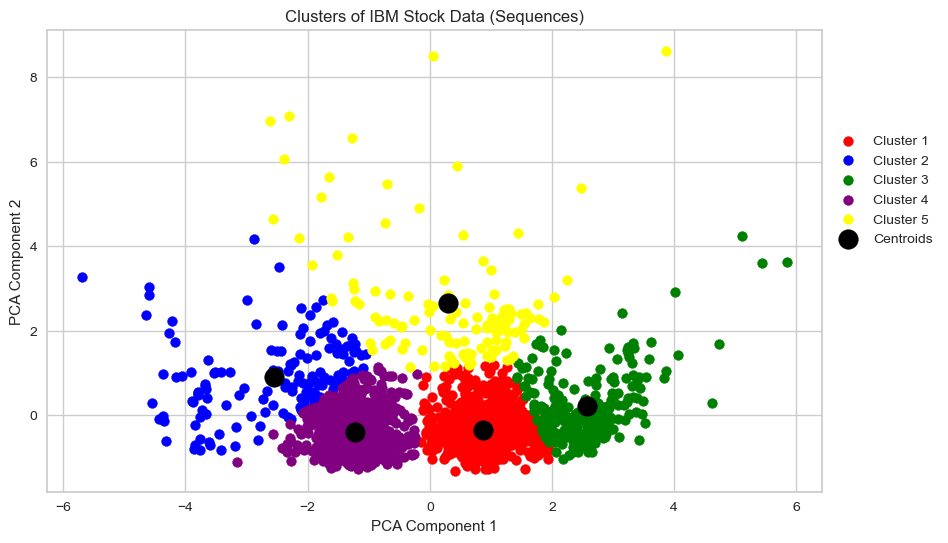

In [74]:

pca = PCA(n_components=2)
pca_data = pca.fit_transform(normalized_data)

kmeans = KMeans(n_clusters=5, random_state=42)
kmeans_labels = kmeans.fit_predict(pca_data)

silhouette_avg_for_KMEANS = silhouette_score(pca_data, kmeans_labels)
print(f'Silhouette Score for KMEANS (K=5): {silhouette_avg}')

davies_bouldin_for_KMEANS = davies_bouldin_score(pca_data, kmeans_labels)
print(f'Davies-Bouldin Index for KMEANS (K=5): {davies_bouldin_for_KMEANS}')

calinski_harabasz_for_KMEANS = calinski_harabasz_score(pca_data, kmeans_labels)
print(f'Calinski-Harabasz Index for KMEANS (K=5): {calinski_harabasz_for_KMEANS}')

plt.figure(figsize=(10, 6))

plt.scatter(pca_data[kmeans_labels == 0, 0], pca_data[kmeans_labels == 0, 1], s=50, c='red', label='Cluster 1')
plt.scatter(pca_data[kmeans_labels == 1, 0], pca_data[kmeans_labels == 1, 1], s=50, c='blue', label='Cluster 2')
plt.scatter(pca_data[kmeans_labels == 2, 0], pca_data[kmeans_labels == 2, 1], s=50, c='green', label='Cluster 3')
plt.scatter(pca_data[kmeans_labels == 3, 0], pca_data[kmeans_labels == 3, 1], s=50, c='purple', label='Cluster 4')
plt.scatter(pca_data[kmeans_labels == 4, 0], pca_data[kmeans_labels == 4, 1], s=50, c='yellow', label='Cluster 5')


plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='black', label='Centroids')

plt.title('Clusters of IBM Stock Data (Sequences)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()


In [75]:
numeric_data['Cluster'] = kmeans_labels

cluster_summary = numeric_data.groupby('Cluster').mean()

cluster_summary

,Open Price,Close Price,Average Volume,Distance,Distance (%)
Cluster,,,,,
0,52.062389,52.500483,7.144645e+06,1.431158,0.680040
1,139.454213,139.831240,4.859148e+06,5.092837,0.288059
2,21.537599,21.660137,1.326843e+07,0.962590,0.387572
3,107.309318,107.684428,4.421996e+06,1.880103,0.310320
4,71.692598,67.872674,1.185432e+07,6.045262,-4.783020


In [81]:

scaler = StandardScaler()
normalized_data = scaler.fit_transform(sequences_df.drop(['Start Date', 'End Date', 'Trend Type'], axis=1))

pca = PCA(n_components=2)
pca_data = pca.fit_transform(normalized_data)

space = {
    'n_clusters': hp.choice('n_clusters', np.arange(2, 11, dtype=int))
}

def objective(params):
    n_clusters = params['n_clusters']
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    kmeans_labels = kmeans.fit_predict(pca_data)
    
    score = silhouette_score(pca_data, kmeans_labels)
    return {'loss': -score, 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=20,
            trials=trials)

best_n_clusters = best['n_clusters'] + 2

print(f"Best number of clusters: {best_n_clusters}")


  0%|                                                                           | 0/20 [00:00<?, ?trial/s, best loss=?]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



  5%|██▍                                             | 1/20 [00:01<00:20,  1.06s/trial, best loss: -0.5391054711072987]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 10%|████▊                                           | 2/20 [00:02<00:18,  1.03s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 15%|███████▏                                        | 3/20 [00:03<00:17,  1.05s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 20%|█████████▌                                      | 4/20 [00:04<00:17,  1.11s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 25%|████████████                                    | 5/20 [00:05<00:16,  1.11s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 30%|██████████████▍                                 | 6/20 [00:06<00:15,  1.08s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 35%|████████████████▊                               | 7/20 [00:07<00:13,  1.05s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 40%|███████████████████▏                            | 8/20 [00:08<00:13,  1.09s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 45%|█████████████████████▌                          | 9/20 [00:09<00:11,  1.06s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 50%|███████████████████████▌                       | 10/20 [00:10<00:10,  1.08s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 55%|█████████████████████████▊                     | 11/20 [00:11<00:09,  1.08s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 60%|████████████████████████████▏                  | 12/20 [00:12<00:08,  1.07s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 65%|██████████████████████████████▌                | 13/20 [00:14<00:07,  1.11s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 70%|████████████████████████████████▉              | 14/20 [00:15<00:06,  1.11s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 75%|███████████████████████████████████▎           | 15/20 [00:16<00:05,  1.12s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 80%|█████████████████████████████████████▌         | 16/20 [00:17<00:04,  1.09s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 85%|███████████████████████████████████████▉       | 17/20 [00:18<00:03,  1.08s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 90%|██████████████████████████████████████████▎    | 18/20 [00:19<00:02,  1.05s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



 95%|████████████████████████████████████████████▋  | 19/20 [00:20<00:01,  1.04s/trial, best loss: -0.5538569924191703]

C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)



100%|███████████████████████████████████████████████| 20/20 [00:21<00:00,  1.07s/trial, best loss: -0.5538569924191703]
Best number of clusters: 6


C:\python\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


Silhouette Score for KMEANS (K=6): 0.5655128890938748
Davies-Bouldin Index for KMEANS (K=6): 0.8774831433554079
Calinski-Harabasz Index for KMEANS (K=6): 1555.1067834031937


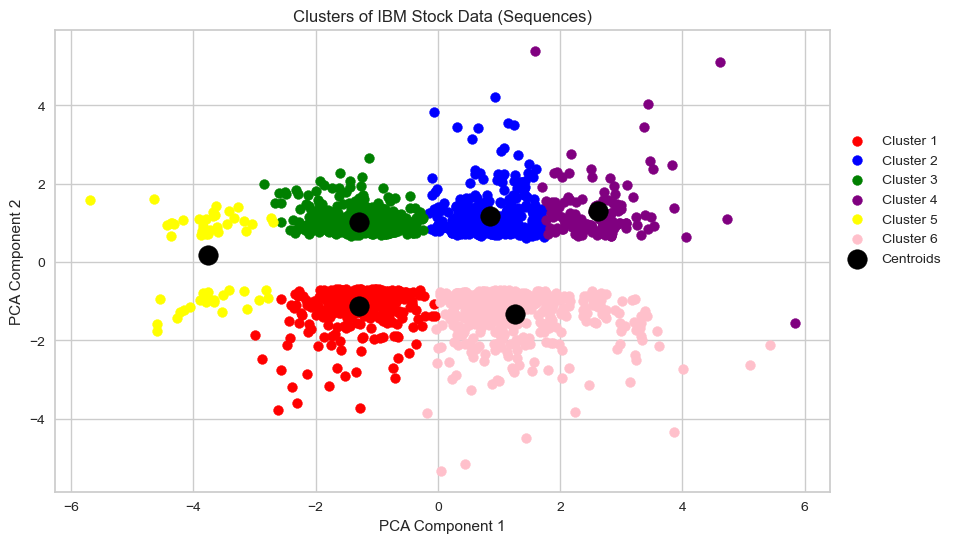

In [82]:

pca = PCA(n_components=2)
pca_data = pca.fit_transform(normalized_data)

kmeans = KMeans(n_clusters=6, random_state=42)
kmeans_labels = kmeans.fit_predict(pca_data)

silhouette_avg_for_KMEANS6 = silhouette_score(pca_data, kmeans_labels)
print(f'Silhouette Score for KMEANS (K=6): {silhouette_avg}')

davies_bouldin_for_KMEANS6 = davies_bouldin_score(pca_data, kmeans_labels)
print(f'Davies-Bouldin Index for KMEANS (K=6): {davies_bouldin_for_KMEANS}')

calinski_harabasz_for_KMEANS6 = calinski_harabasz_score(pca_data, kmeans_labels)
print(f'Calinski-Harabasz Index for KMEANS (K=6): {calinski_harabasz_for_KMEANS}')

plt.figure(figsize=(10, 6))

plt.scatter(pca_data[kmeans_labels == 0, 0], pca_data[kmeans_labels == 0, 1], s=50, c='red', label='Cluster 1')
plt.scatter(pca_data[kmeans_labels == 1, 0], pca_data[kmeans_labels == 1, 1], s=50, c='blue', label='Cluster 2')
plt.scatter(pca_data[kmeans_labels == 2, 0], pca_data[kmeans_labels == 2, 1], s=50, c='green', label='Cluster 3')
plt.scatter(pca_data[kmeans_labels == 3, 0], pca_data[kmeans_labels == 3, 1], s=50, c='purple', label='Cluster 4')
plt.scatter(pca_data[kmeans_labels == 4, 0], pca_data[kmeans_labels == 4, 1], s=50, c='yellow', label='Cluster 5')
plt.scatter(pca_data[kmeans_labels == 5, 0], pca_data[kmeans_labels == 5, 1], s=50, c='pink', label='Cluster 6')



plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='black', label='Centroids')

plt.title('Clusters of IBM Stock Data (Sequences)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()


## Building biplot

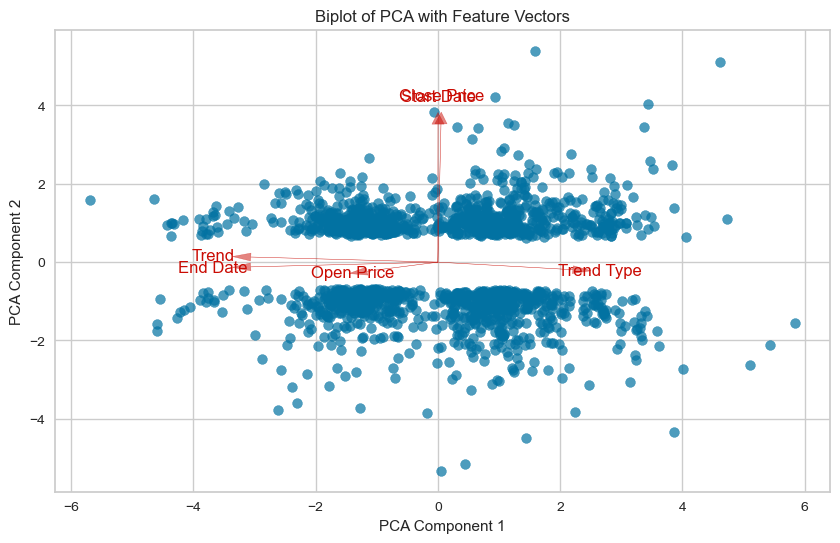

In [76]:

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
normalized_data = scaler.fit_transform(sequences_df.drop(['Start Date', 'End Date', 'Trend Type'], axis=1))

pca = PCA(n_components=2)
reduced_data = pca.fit_transform(normalized_data)

reduced_data = pd.DataFrame(reduced_data, columns=['Dimension 1', 'Dimension 2'])

def biplot(original_data, reduced_data, pca):
    plt.figure(figsize=(10, 6))
    
    plt.scatter(reduced_data['Dimension 1'], reduced_data['Dimension 2'], s=50, alpha=0.7, label="Reduced Data")

    feature_vectors = pca.components_.T
    n_features = original_data.shape[1]
    
    for i in range(n_features):
        plt.arrow(0, 0, feature_vectors[i, 0] * 5, feature_vectors[i, 1] * 5, 
                  color='r', alpha=0.5, head_width=0.2, label=f"Feature {i+1}")
        plt.text(feature_vectors[i, 0] * 6, feature_vectors[i, 1] * 6, sequences_df.columns[i], 
                 color='r', ha='center', va='center')
    
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.title("Biplot of PCA with Feature Vectors")
    plt.grid(True)
    plt.show()

biplot(sequences_df.drop(['Start Date', 'End Date', 'Trend Type'], axis=1), reduced_data, pca)


## GMM

In [77]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from sklearn.mixture import GaussianMixture

scaler = StandardScaler()
normalized_data = scaler.fit_transform(sequences_df.drop(['Start Date', 'End Date', 'Trend Type'], axis=1))

space = {
    'n_components': hp.choice('n_components', np.arange(2, 11, dtype=int)),
    'covariance_type': hp.choice('covariance_type', ['full', 'tied', 'diag', 'spherical'])
}

def objective(params):
    n_components = params['n_components']
    covariance_type = params['covariance_type']
    
    gmm = GaussianMixture(n_components=n_components, covariance_type=covariance_type, random_state=42)
    gmm_labels = gmm.fit_predict(normalized_data)
    
    score = silhouette_score(normalized_data, gmm_labels)
    return {'loss': -score, 'status': STATUS_OK}

trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=20,
            trials=trials)

best_n_components = best['n_components'] + 2
best_covariance_type = ['full', 'tied', 'diag', 'spherical'][best['covariance_type']]

print(f"Best number of components: {best_n_components}")
print(f"Best covariance type: {best_covariance_type}")


100%|██████████████████████████████████████████████| 20/20 [00:05<00:00,  3.89trial/s, best loss: -0.39883675093432225]
Best number of components: 10
Best covariance type: tied


Silhouette Score for GMM: 0.39883675093432225
Davies-Bouldin Index for GMM: 0.9536786902897749
Calinski-Harabasz Index for GMM: 611.9500564807905


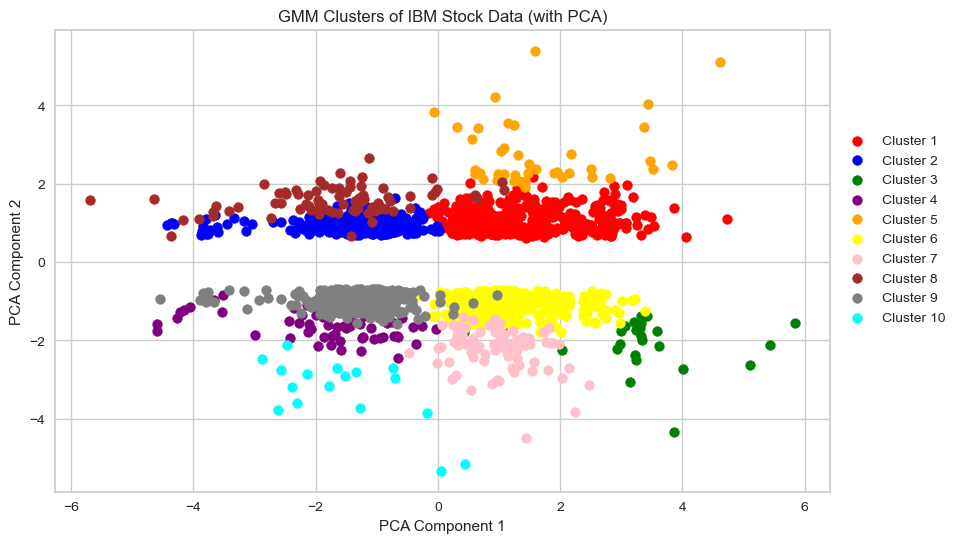

In [78]:

scaler = StandardScaler()
normalized_data = scaler.fit_transform(sequences_df.drop(['Start Date', 'End Date', 'Trend Type'], axis=1))

pca = PCA(n_components=2)
pca_data = pca.fit_transform(normalized_data)

gmm = GaussianMixture(n_components=10, covariance_type='tied', random_state=42)
gmm_labels = gmm.fit_predict(normalized_data)

silhouette_avg_for_gmm = silhouette_score(normalized_data, gmm_labels)
print(f'Silhouette Score for GMM: {silhouette_avg_for_gmm}')

davies_bouldin_for_gmm = davies_bouldin_score(normalized_data, gmm_labels)
print(f'Davies-Bouldin Index for GMM: {davies_bouldin_for_gmm}')

calinski_harabasz_for_gmm = calinski_harabasz_score(normalized_data, gmm_labels)
print(f'Calinski-Harabasz Index for GMM: {calinski_harabasz_for_gmm}')

plt.figure(figsize=(10, 6))

plt.scatter(pca_data[gmm_labels == 0, 0], pca_data[gmm_labels == 0, 1], s=50, c='red', label='Cluster 1')
plt.scatter(pca_data[gmm_labels == 1, 0], pca_data[gmm_labels == 1, 1], s=50, c='blue', label='Cluster 2')
plt.scatter(pca_data[gmm_labels == 2, 0], pca_data[gmm_labels == 2, 1], s=50, c='green', label='Cluster 3')
plt.scatter(pca_data[gmm_labels == 3, 0], pca_data[gmm_labels == 3, 1], s=50, c='purple', label='Cluster 4')
plt.scatter(pca_data[gmm_labels == 4, 0], pca_data[gmm_labels == 4, 1], s=50, c='orange', label='Cluster 5')
plt.scatter(pca_data[gmm_labels == 5, 0], pca_data[gmm_labels == 5, 1], s=50, c='yellow', label='Cluster 6')
plt.scatter(pca_data[gmm_labels == 6, 0], pca_data[gmm_labels == 6, 1], s=50, c='pink', label='Cluster 7')
plt.scatter(pca_data[gmm_labels == 7, 0], pca_data[gmm_labels == 7, 1], s=50, c='brown', label='Cluster 8')
plt.scatter(pca_data[gmm_labels == 8, 0], pca_data[gmm_labels == 8, 1], s=50, c='gray', label='Cluster 9')
plt.scatter(pca_data[gmm_labels == 9, 0], pca_data[gmm_labels == 9, 1], s=50, c='cyan', label='Cluster 10')

plt.title('GMM Clusters of IBM Stock Data (with PCA)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()


## AgglomerativeClustering

C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


Silhouette Score for Agglomerative Clustering: 0.3346889043258994
Davies-Bouldin Index for Agglomerative Clustering: 1.122937314184258
Calinski-Harabasz Index for Agglomerative Clustering: 647.1989095362275


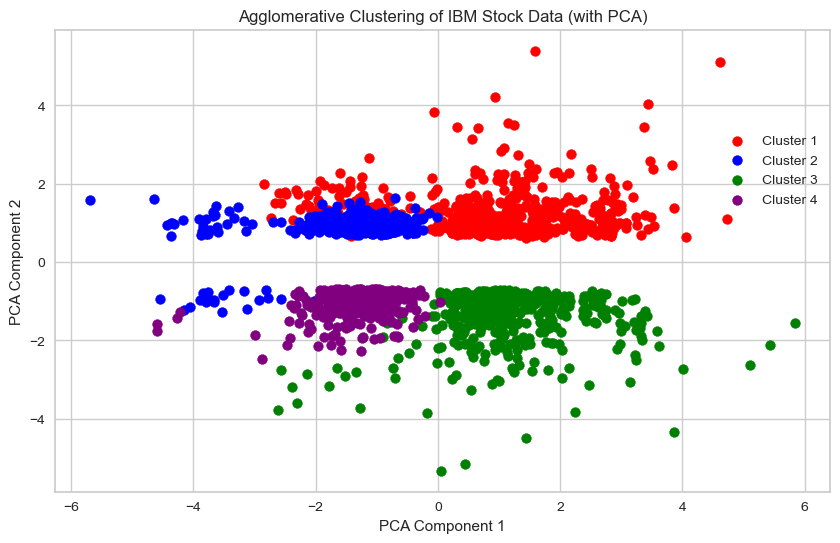

In [79]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score

scaler = StandardScaler()
normalized_data = scaler.fit_transform(sequences_df.drop(['Start Date', 'End Date', 'Trend Type'], axis=1))

pca = PCA(n_components=2)
pca_data = pca.fit_transform(normalized_data)

agg_clustering = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
agg_labels = agg_clustering.fit_predict(normalized_data)

silhouette_avg_for_agg = silhouette_score(normalized_data, agg_labels)
print(f'Silhouette Score for Agglomerative Clustering: {silhouette_avg_for_agg}')

davies_bouldin_for_agg = davies_bouldin_score(normalized_data, agg_labels)
print(f'Davies-Bouldin Index for Agglomerative Clustering: {davies_bouldin_for_agg}')

calinski_harabasz_for_agg = calinski_harabasz_score(normalized_data, agg_labels)
print(f'Calinski-Harabasz Index for Agglomerative Clustering: {calinski_harabasz_for_agg}')

plt.figure(figsize=(10, 6))

unique_labels = set(agg_labels)
colors = ['red', 'blue', 'green', 'purple', 'magenta', 'orange', 'brown', 'pink', 'gray']

for i, label in enumerate(unique_labels):
    plt.scatter(pca_data[agg_labels == label, 0], pca_data[agg_labels == label, 1], 
                s=50, c=colors[i % len(colors)], label=f'Cluster {label + 1}')

plt.title('Agglomerative Clustering of IBM Stock Data (with PCA)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(bbox_to_anchor=[1, 0.8])
plt.grid(True)
plt.show()


C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(
C:\python\Lib\site-packages\sklearn\cluster\_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


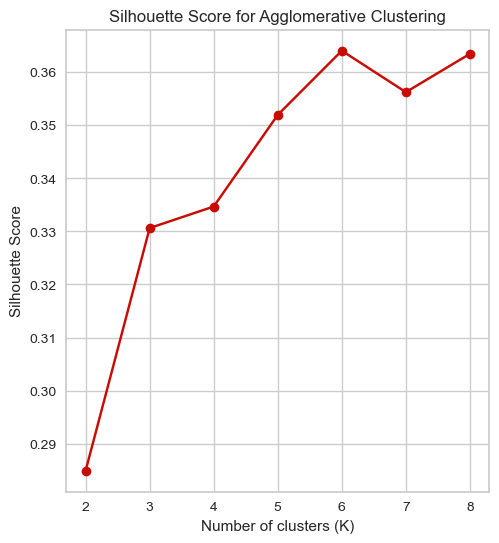

In [83]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
import matplotlib.pyplot as plt
import numpy as np

scaler = StandardScaler()
normalized_data = scaler.fit_transform(sequences_df.drop(['Start Date', 'End Date', 'Trend Type'], axis=1))

pca = PCA(n_components=2)
pca_data = pca.fit_transform(normalized_data)

K_range = range(2, 9)  
silhouette_scores = []

for K in K_range:
    agg_clustering = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='ward')
    agg_labels = agg_clustering.fit_predict(normalized_data)
    
    silhouette_avg = silhouette_score(normalized_data, agg_labels)
    silhouette_scores.append(silhouette_avg)

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(K_range, silhouette_scores, marker='o', color='r')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Agglomerative Clustering')

plt.show()


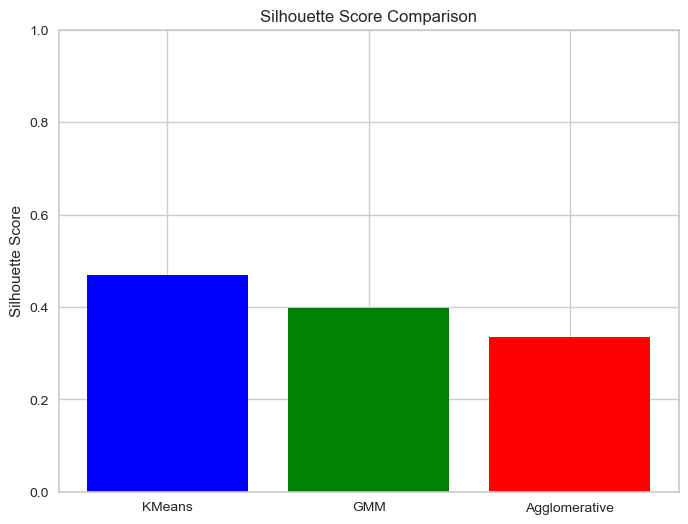

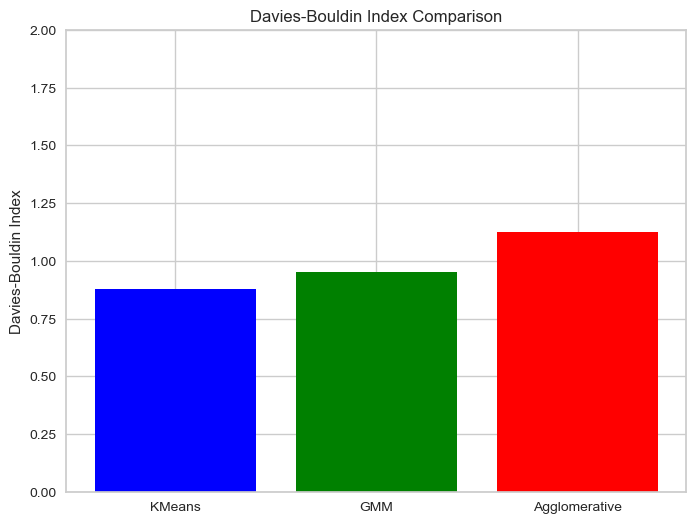

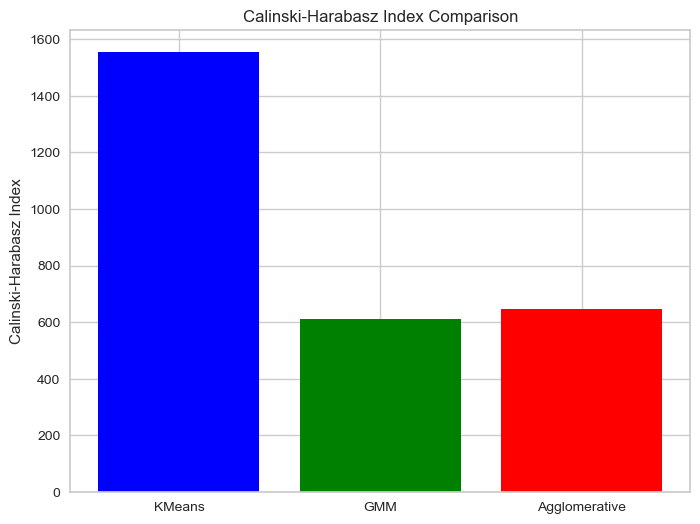

In [80]:

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'GMM', 'Agglomerative'], 
        [silhouette_avg_for_KMEANS, silhouette_avg_for_gmm, silhouette_avg_for_agg], 
        color=['blue', 'green', 'red'])
plt.title('Silhouette Score Comparison')
plt.ylabel('Silhouette Score')
plt.ylim(0, 1)
plt.grid(True)

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'GMM', 'Agglomerative'], 
        [davies_bouldin_for_KMEANS, davies_bouldin_for_gmm, davies_bouldin_for_agg], 
        color=['blue', 'green', 'red'])
plt.title('Davies-Bouldin Index Comparison')
plt.ylabel('Davies-Bouldin Index')
plt.ylim(0, 2)
plt.grid(True)

plt.figure(figsize=(8, 6))
plt.bar(['KMeans', 'GMM', 'Agglomerative'], 
        [calinski_harabasz_for_KMEANS, calinski_harabasz_for_gmm, calinski_harabasz_for_agg], 
        color=['blue', 'green', 'red'])
plt.title('Calinski-Harabasz Index Comparison')
plt.ylabel('Calinski-Harabasz Index')
plt.grid(True)

plt.show()


# Why Kmeans always produced the best results?

#### The reason KMeans consistently produced the best results across different sequence types could be due to the inherent structure of the stock data. The stock's price movements likely follow clear, consistent patterns, making KMeans effective in clustering around central points. KMeans works well when data has symmetrical distributions or gradual trends, which is typical in stock data with clear upward or downward movements. Additionally, using the Elbow method to determine the optimal number of clusters helped refine the model’s performance, allowing KMeans to excel by capturing the natural groupings in the data.